## Candescence with the GRACE library

## 0. Loading the libraries

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
from umap import UMAP
import graphtools as gt

#import seaborn as sb
#sb.set_context('notebook')

%matplotlib inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.figsize']=(8,8) #rescale figures
plt.rcParams.update({'figure.max_open_warning': 0})


/home/hallett/anaconda3/envs/deepmicroscopy/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Global path variables

In [3]:
REFINED="/home/data/refined/candescence/performance/grace_macro/"


## 1. Reading in the data

Read in the entire GRACE description spreadsheet. This has all the variables.

In [65]:
everything = pd.read_csv(REFINED+"python_img_summaries_biglittlelittle_thresh_0.2.csv")
everything[['macro_manual_score']] = everything[['macro_manual_score']].astype(str)
print(everything)

                            filename  n_objects       name.x       f_0  \
0      both_R1_P1_A1_1_00d00h00m.bmp        141         ENP1  0.070922   
1     both_R1_P1_A10_1_00d00h00m.bmp        217        PGA63  0.013825   
2     both_R1_P1_A11_1_00d00h00m.bmp        182  C7_00780W_A  0.032967   
3     both_R1_P1_A12_1_00d00h00m.bmp        153  C3_06820C_A  0.058824   
4      both_R1_P1_A2_1_00d00h00m.bmp        178  C6_00640C_A  0.050562   
...                              ...        ...          ...       ...   
6603   both_R2_P9_H5_1_00d00h35m.bmp        262  CR_05560W_A  0.057252   
6604   both_R2_P9_H6_1_00d00h35m.bmp        296        PRP22  0.047297   
6605   both_R2_P9_H7_1_00d00h35m.bmp        289         NIP7  0.027682   
6606   both_R2_P9_H8_1_00d00h35m.bmp        262         NOG2  0.053435   
6607   both_R2_P9_H9_1_00d00h35m.bmp        242  C7_01810W_A  0.033058   

           f_1       f_2  f_macrophage       f_3     f_UFO  a_0  ...  \
0     0.198582  0.205674      0.524823 

In [66]:
print(everything.columns)

Index(['filename', 'n_objects', 'name.x', 'f_0', 'f_1', 'f_2', 'f_macrophage',
       'f_3', 'f_UFO', 'a_0', 'a_1', 'a_2', 'a_macrophage', 'a_3', 'a_UFO',
       'plate', 'row', 'column', 'replicate', 'name.y', 'macro_manual_score',
       'tc_manual_score', 'orf', 'common', 'feature_name', 'description',
       'sc_homologue', 'sc_ko_pheno', 'Merck Strain ID', 'GELC ID',
       'Primary CGD ID', 'YPD morphology', 'YPD + DOX morphology',
       'Serum morphology', 'Serum + DOX morphology', '100 μg/mL DOX growth',
       '5-FOA excision', 'No_DOX_score', 'DOX_Score', 'Essential_verdict',
       'Cidal_test', 'Macrophage + DOX morphology TO1',
       'Macrophage + DOX morphology TO2', 'Variance',
       'Screen pilot rep 1 OD600+DOX 19-03-21',
       'Screen pilot rep 1 MO+DOX 19-03-21',
       'Screen pilot rep 2 OD600+DOX 19-03-21',
       'Screen pilot rep 2 MO+DOX 19-03-21',
       'Screen pilot rep 1 OD600-DOX 19-03-21',
       'Screen pilot rep 1 MO-DOX 19-03-21',
       'Screen pi

## 2 UMAP

We create two series of UMAPs. UMAPs attempt to capture essential relationships between the images. The images are described in two ways.
Either using relative values e.g.  $f_0$, the frequency of $0$ labelled cells in an image (but using the vcector across all important classes). Or using absolute values e.g. $a_0$, the raw number of cells of type $0$ in the image.

In [6]:
import umap
reducer = umap.UMAP()

rel_data = everything[ [
        "f_0", "f_1", "f_2", "f_3", "f_macrophage", "f_UFO"
    ]].values

abs_data = everything[ [
        "a_0", "a_1", "a_2", "a_3", "a_macrophage", "a_UFO"
    ]].values


In [7]:
embedding_rel = reducer.fit_transform(rel_data)
embedding_rel.shape

/home/hallett/anaconda3/envs/deepmicroscopy/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
OMP: Info #274: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


(6608, 2)

## Absolute counts


In [8]:
embedding_abs = reducer.fit_transform(abs_data)
embedding_abs.shape

(6608, 2)

In [9]:
mapper_abs = umap.UMAP().fit(abs_data)

In [10]:
import umap.plot


Here we draw the UMAP and superimpose the manual labels to start. And then changing the coloring according to different variables. Actually I could superimpose any of the variables from teh excel spreadsheet here.

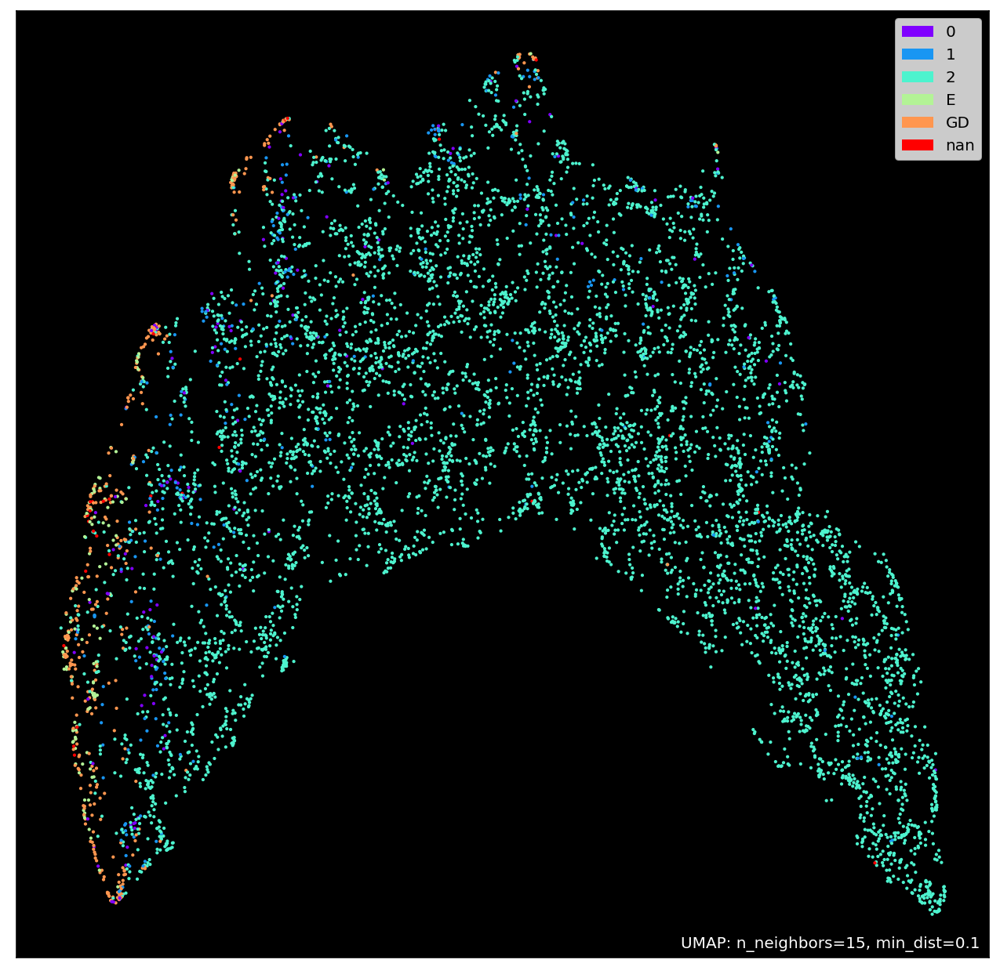

In [11]:
umap.plot.points(mapper_abs,  labels=everything.macro_manual_score, theme='fire') # color_key_cmap='Paired',

You can see that non-class 2 labels above are almost always in sparsely populated cells (next image). Here white is the lowest absolute counts while blue is the highest.

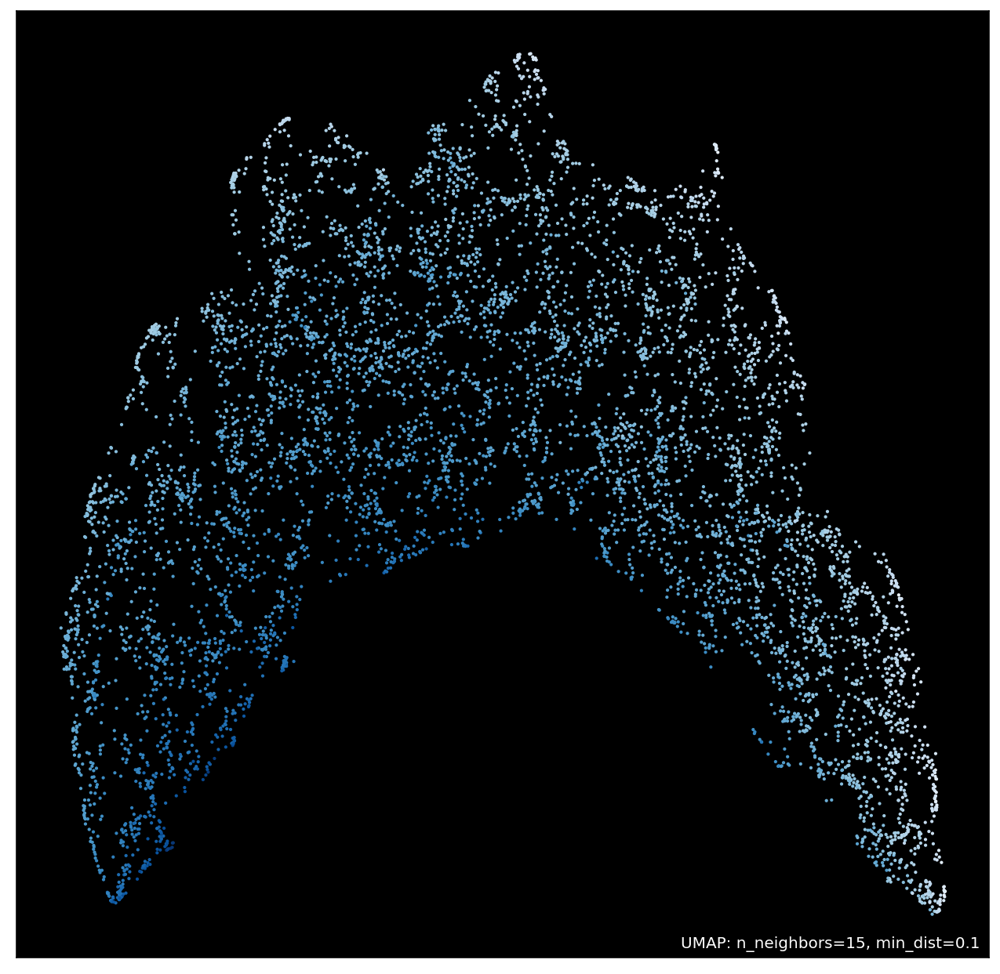

In [12]:
umap.plot.points(mapper_abs,  values=everything.n_objects,  background='black') # color_key_cmap='Paired',

The next image superimposes the absolute counts for macrophages. This gives us further insight into the manual labelling. Almost all non-class 2 labels are in images with a high number of macrophages.

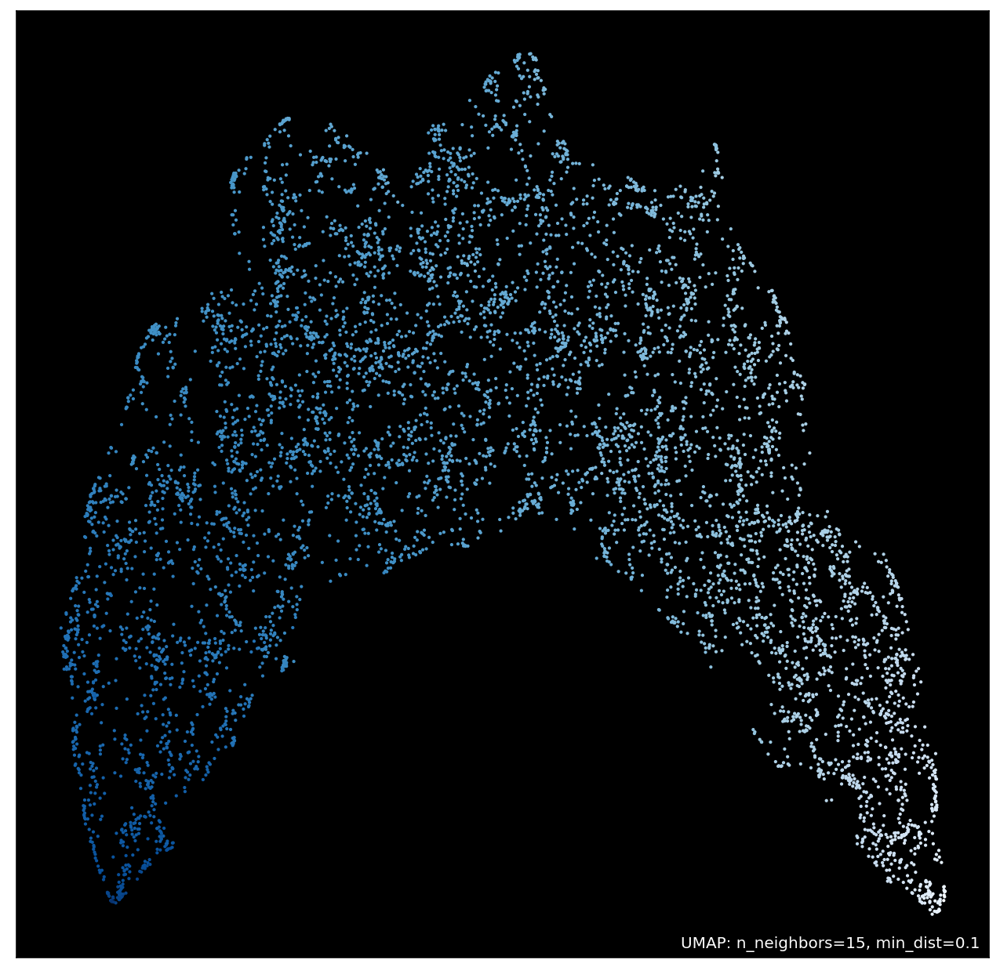

In [13]:
umap.plot.points(mapper_abs,  values=everything.a_macrophage,  background='black') # color_key_cmap='Paired',


Now a series of images for the absolute counts of 0, 1, 2, 3 and UFOs.

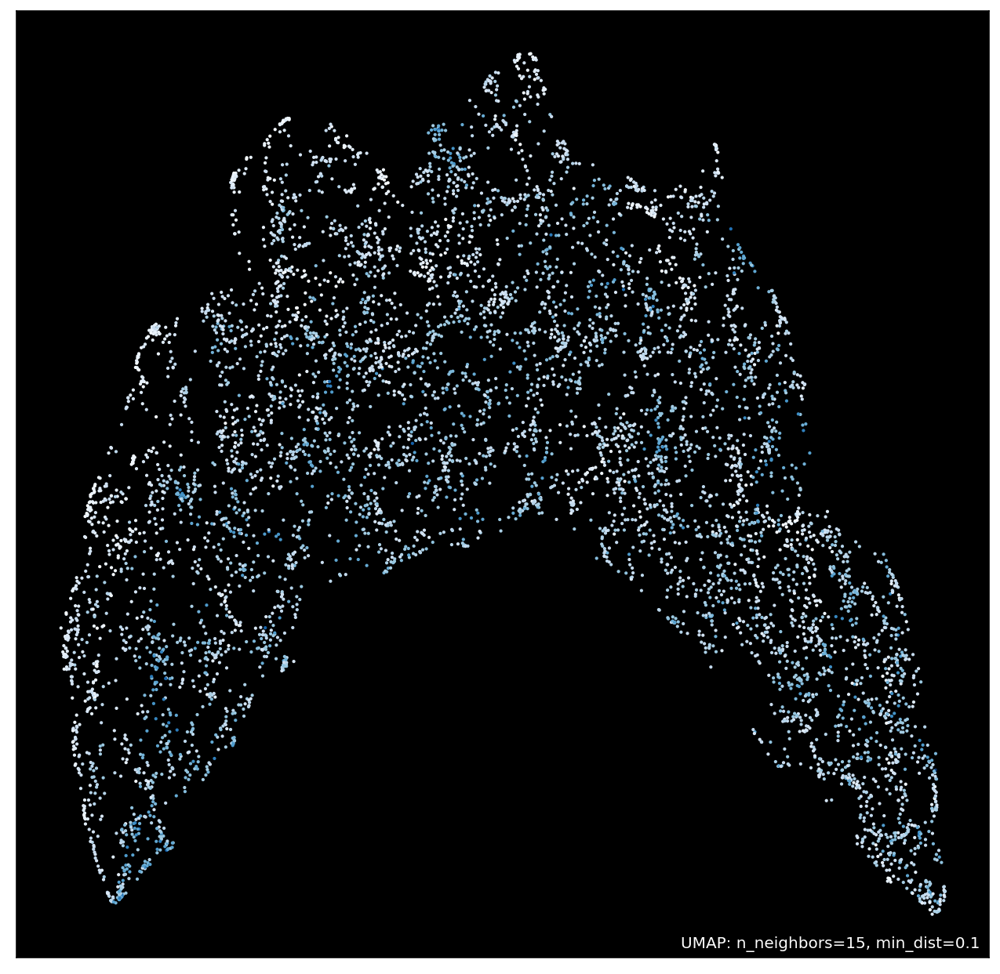

In [14]:
umap.plot.points(mapper_abs,  values=everything.a_0,  background='black') # color_key_cmap='Paired',


You can see here that the right "arm" of the UMAP is highly enriched for images that have many class-1 cells.

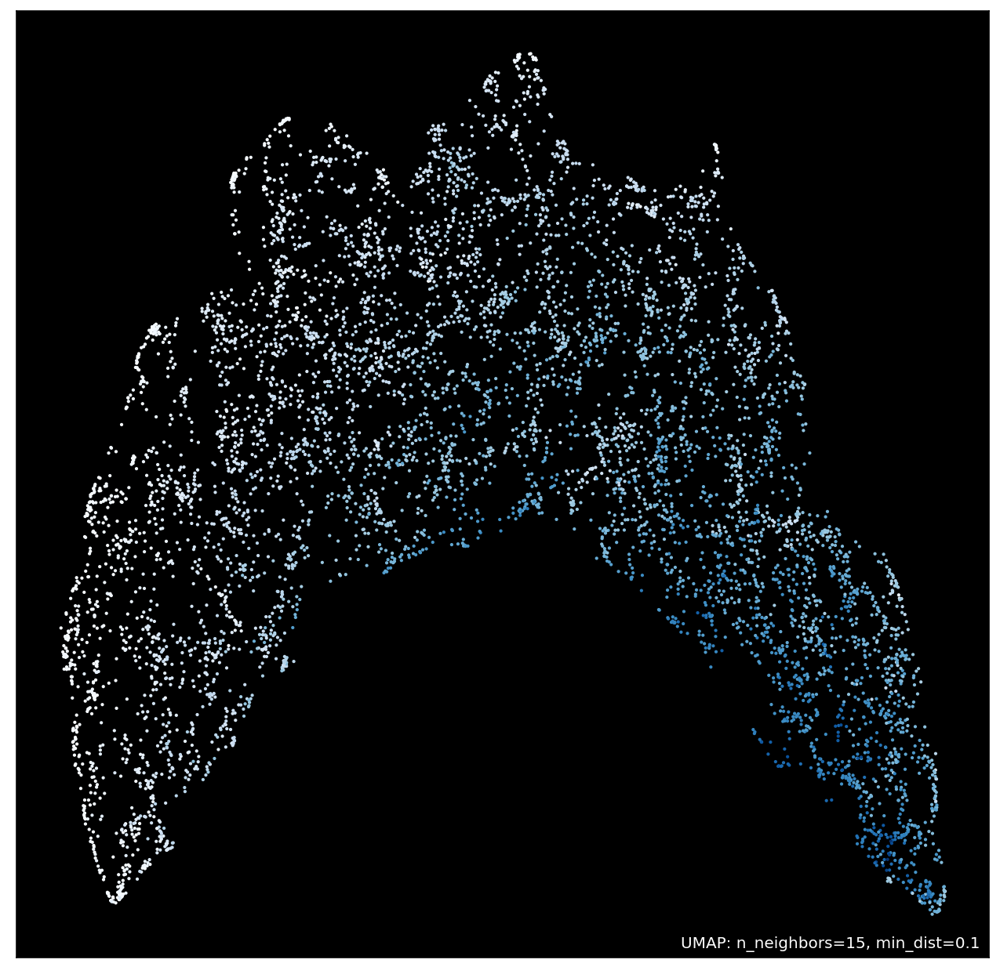

In [15]:
umap.plot.points(mapper_abs,  values=everything.a_1,  background='black') # color_key_cmap='Paired',


Also true for class-2 enriched cells.

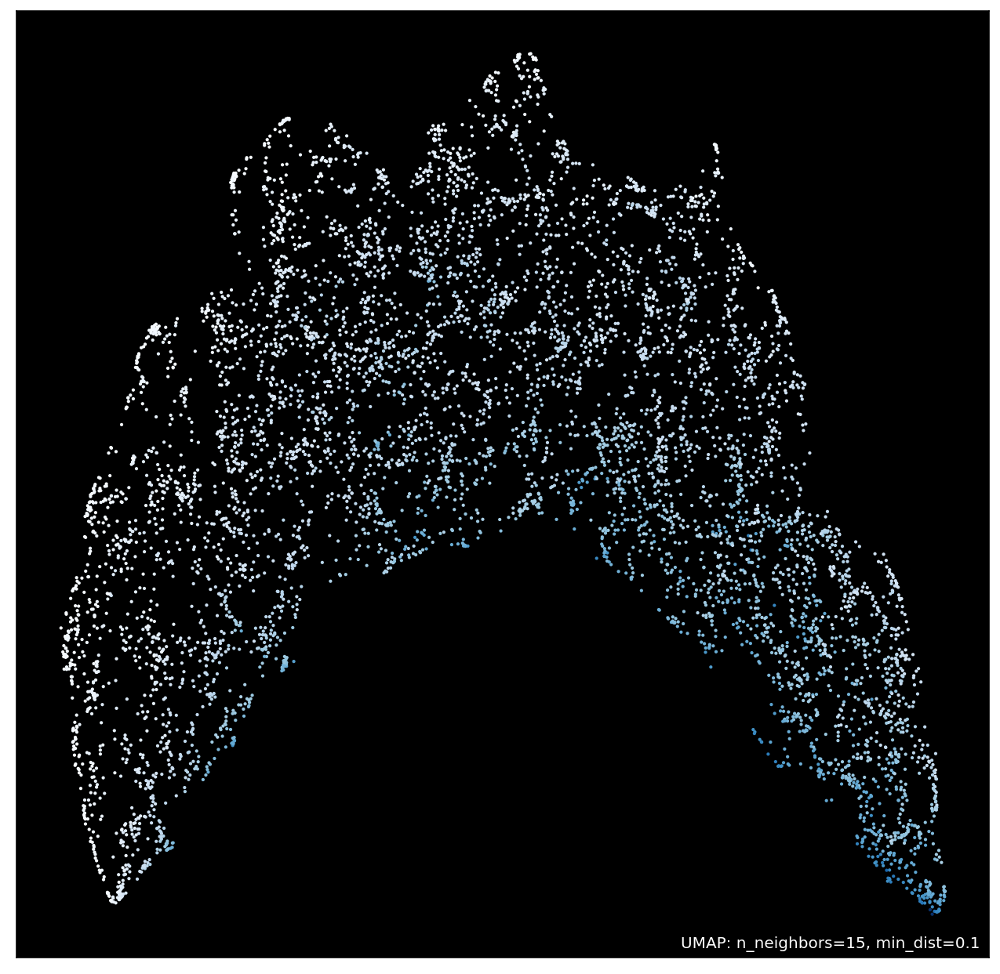

In [16]:
umap.plot.points(mapper_abs,  values=everything.a_2,  background='black') # color_key_cmap='Paired',


Class 3's are scattered across the UMAP, mixed with class 2's for the most part. This makes sense.

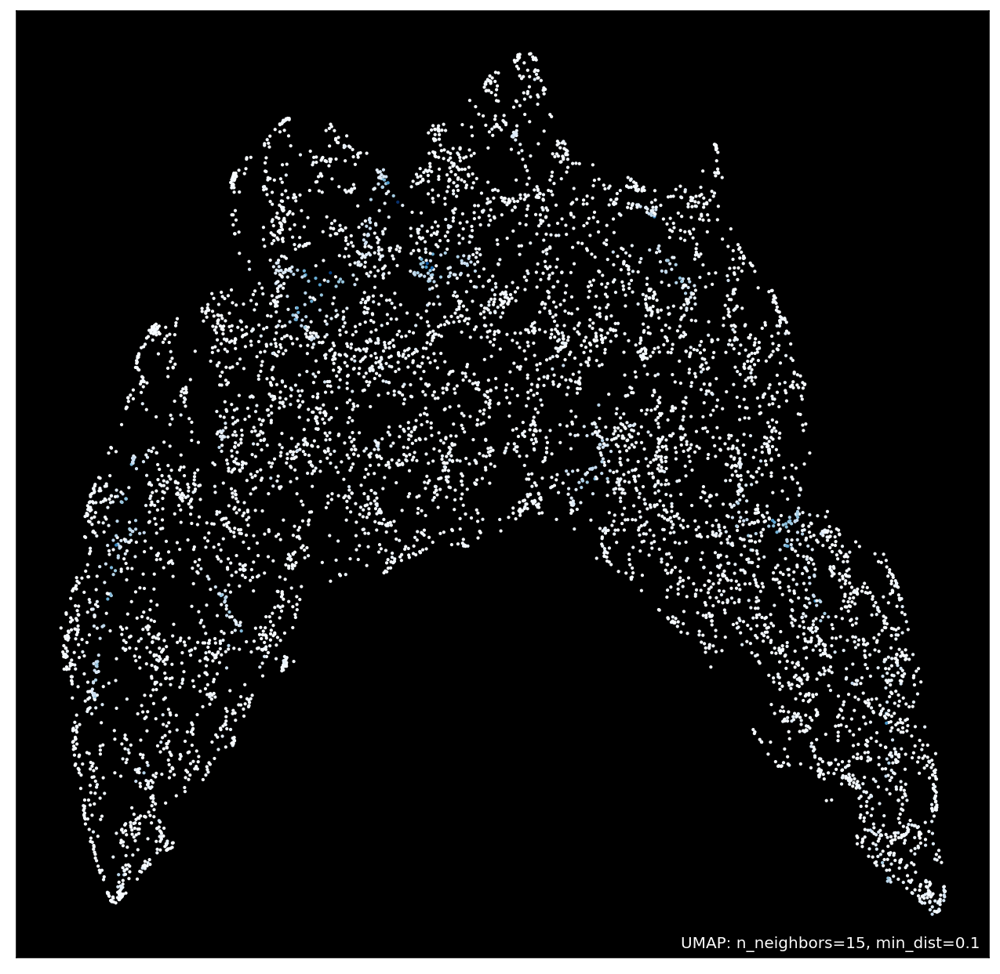

In [17]:
umap.plot.points(mapper_abs,  values=everything.a_3,  background='black') # color_key_cmap='Paired',


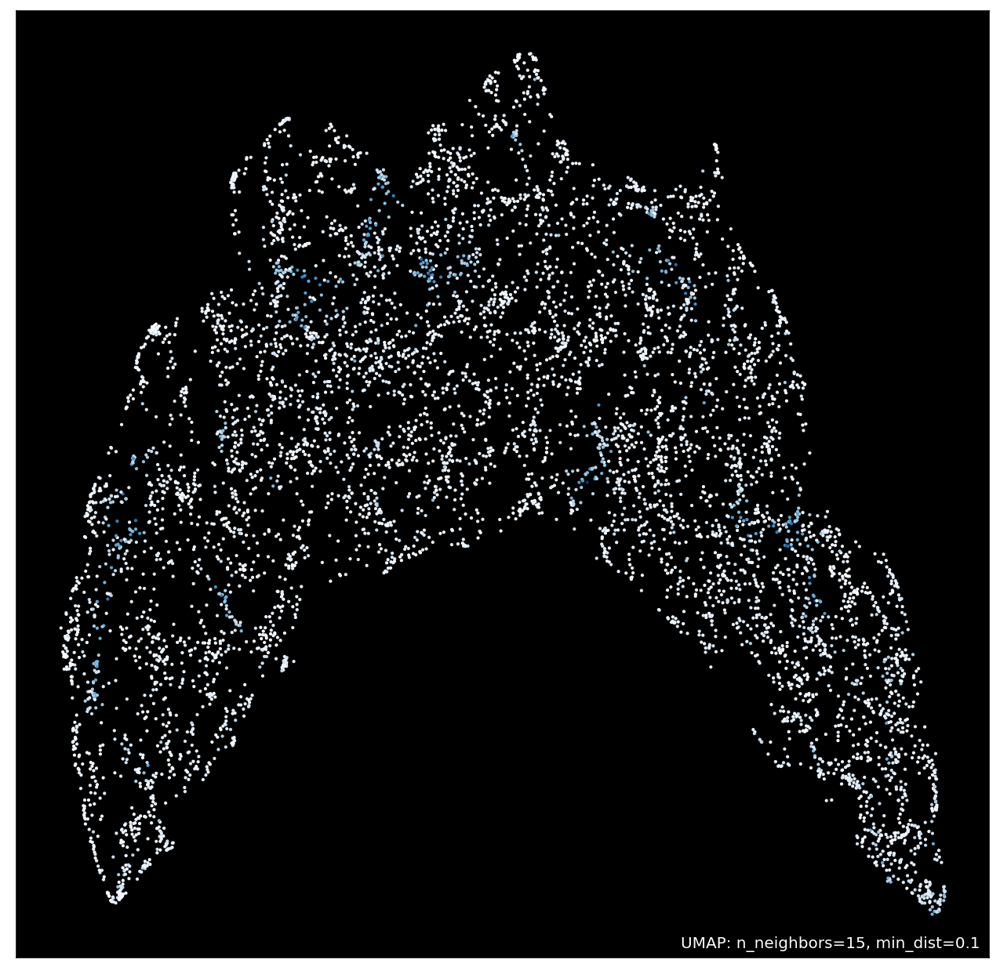

In [18]:
umap.plot.points(mapper_abs,  values=everything.a_UFO,  background='black') # color_key_cmap='Paired',


## Relative frequencies

I find that mapping the relative frequencies onto this same UMAP is more informative.

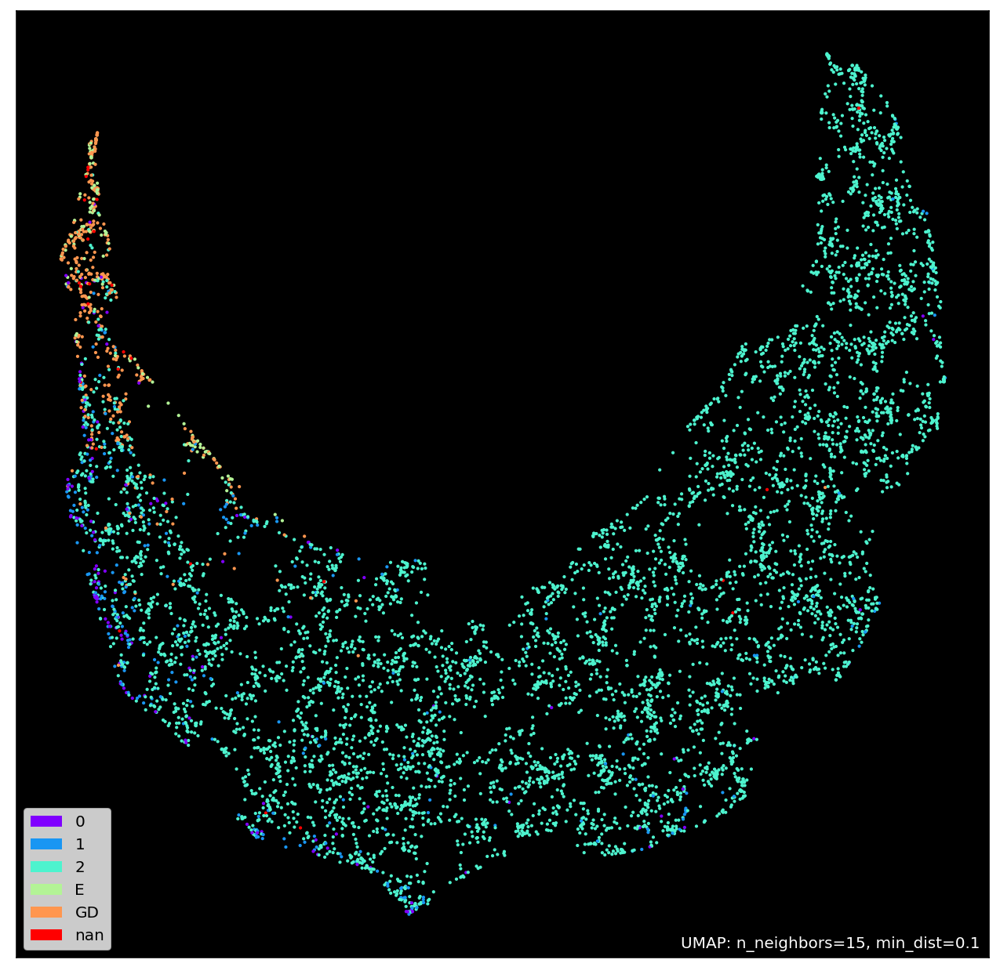

In [19]:
mapper_rel = umap.UMAP().fit(rel_data)
umap.plot.points(mapper_rel,  labels=everything.macro_manual_score, theme='fire') # color_key_cmap='Paired',


Note that the observation about sparsely populated images and non-class 2 labels is also visible in the relative images.

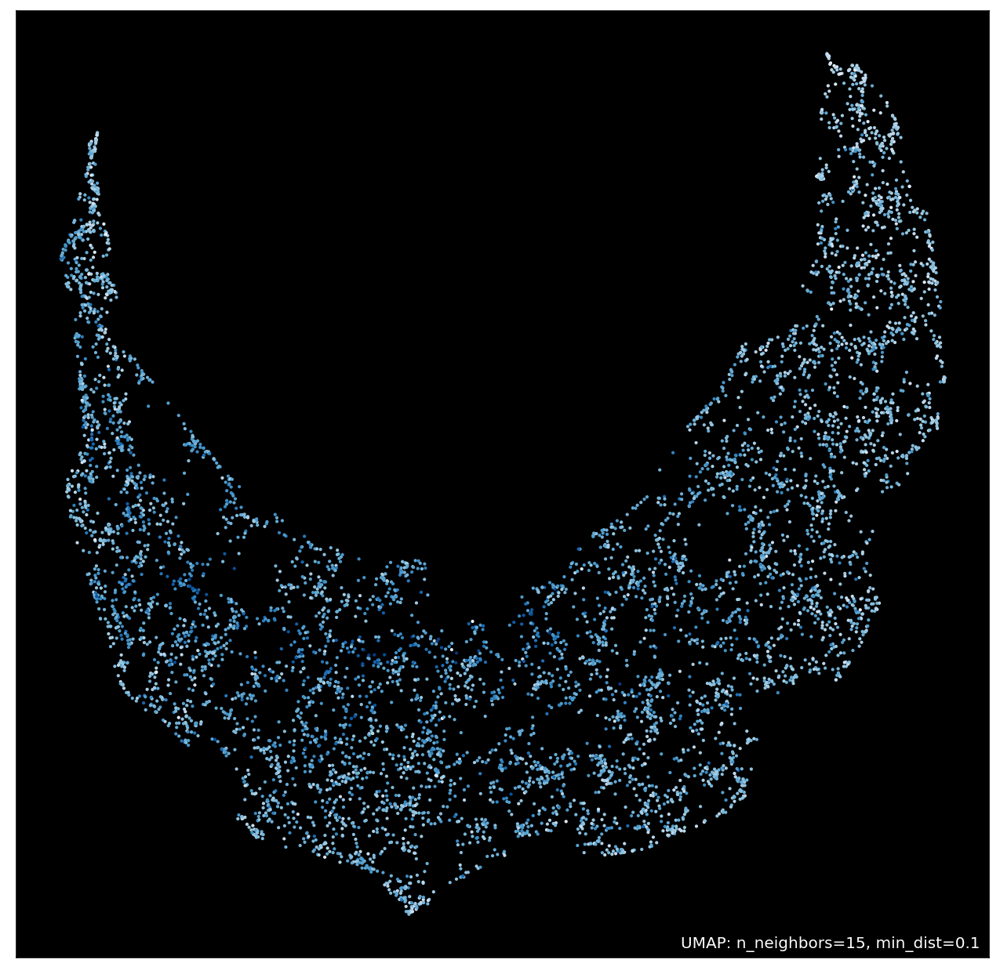

In [20]:
umap.plot.points(mapper_rel,  values=everything.n_objects,  background='black') # color_key_cmap='Paired',


Here you can strongly see the relationship between high relative macrophage (non-infected) cells and non-class 2 cells. This makes sense for the GD labelled cells but it suggests that there has been some human bias for the other classes.

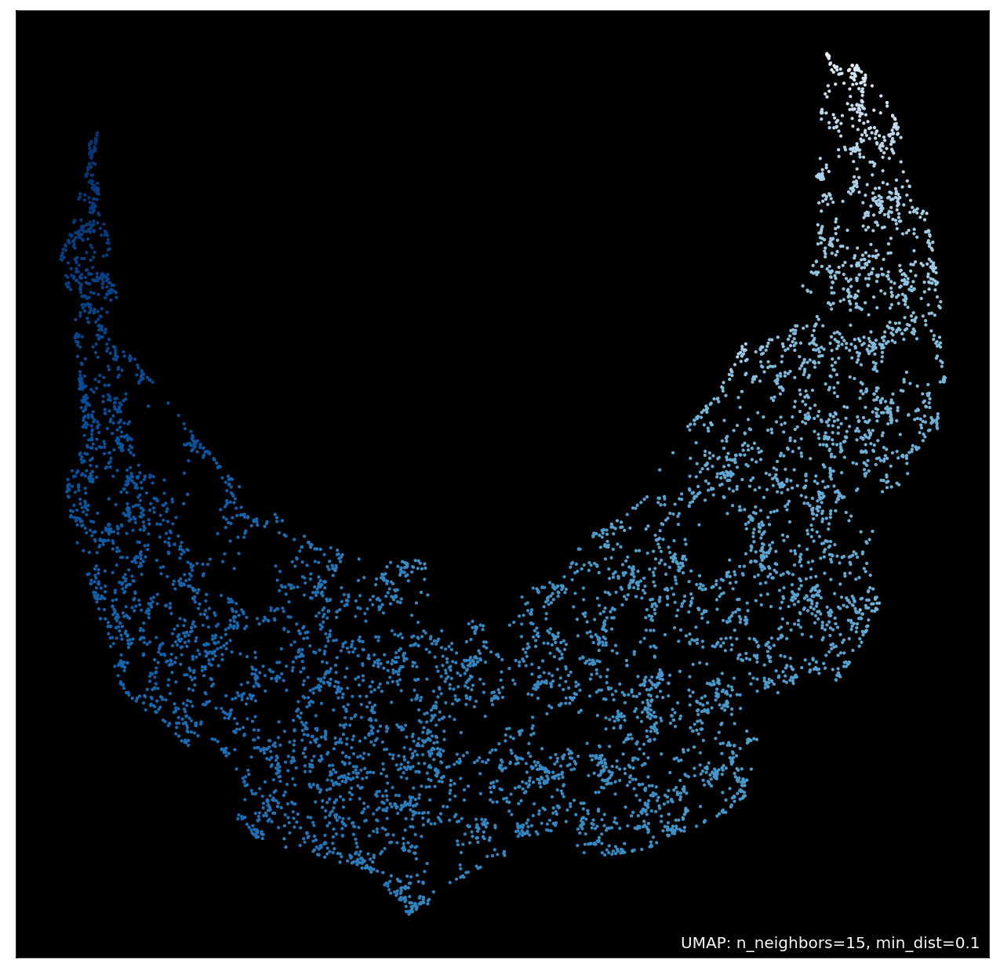

In [21]:
umap.plot.points(mapper_rel,  values=everything.f_macrophage,  background='black') # color_key_cmap='Paired',


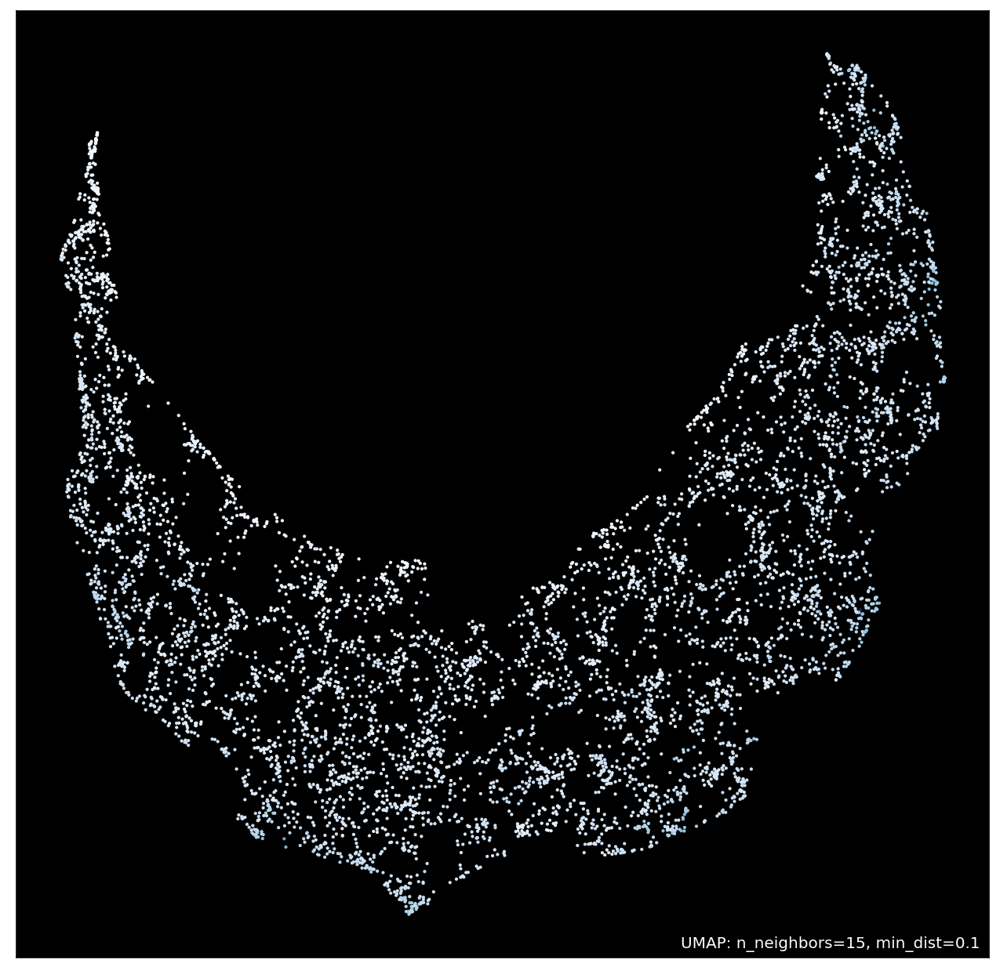

In [22]:
umap.plot.points(mapper_rel,  values=everything.f_0,  background='black') # color_key_cmap='Paired',


In the following two images, you see very clearly that class 1 and class 2 are distinct types of images. They have stable but distinct patterns, although they are close in UMAP space. 

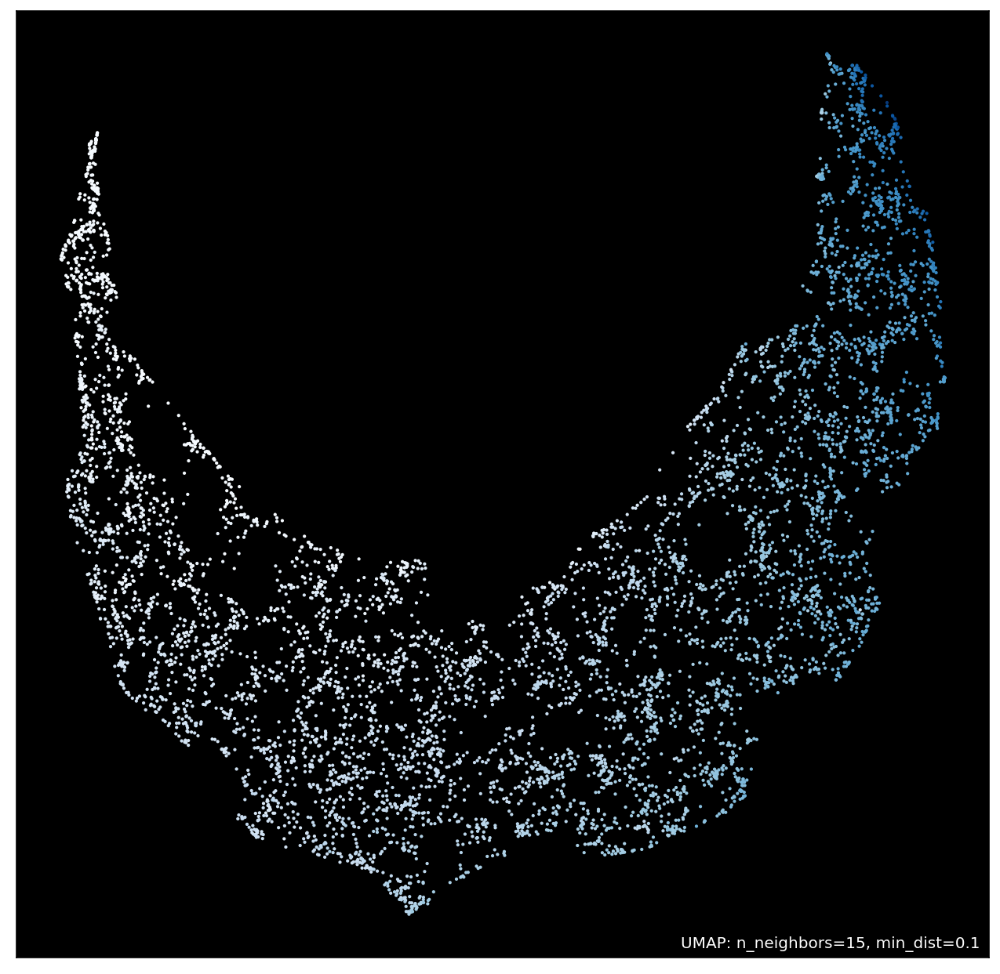

In [23]:
umap.plot.points(mapper_rel,  values=everything.f_1,  background='black') # color_key_cmap='Paired',


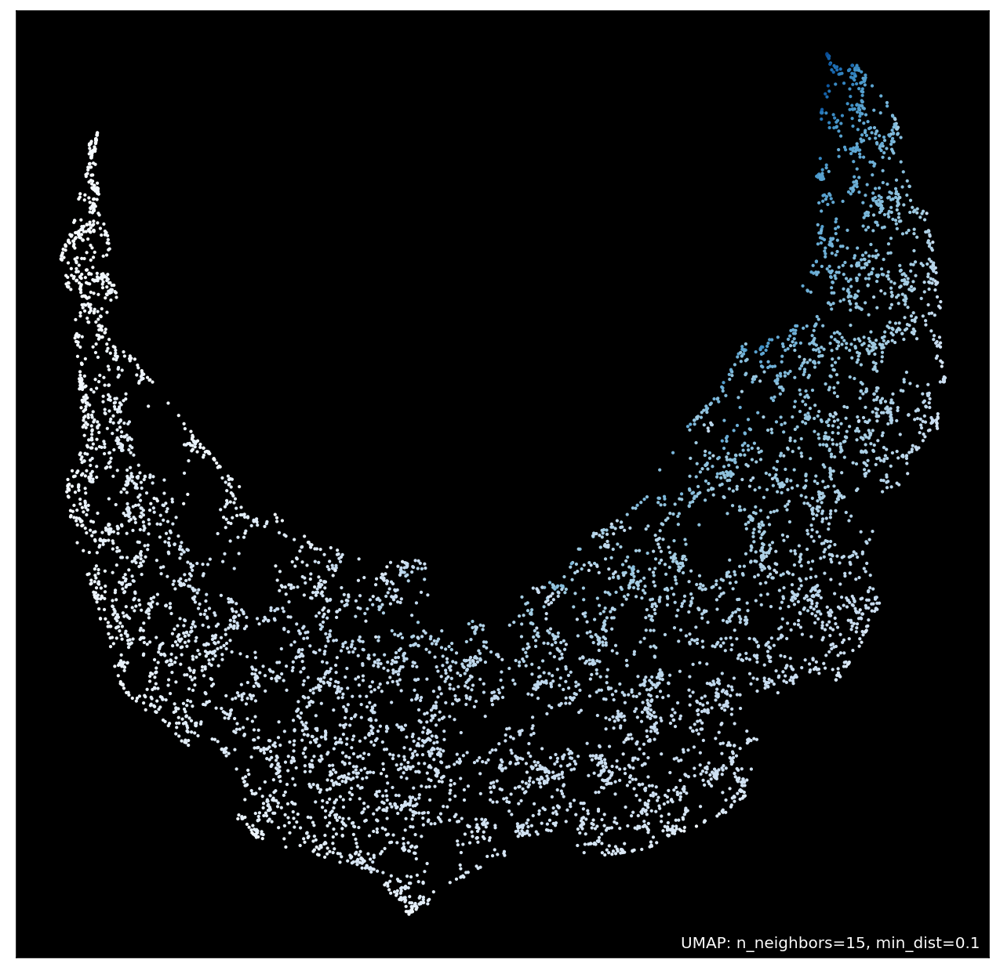

In [24]:
umap.plot.points(mapper_rel,  values=everything.f_2,  background='black') # color_key_cmap='Paired',


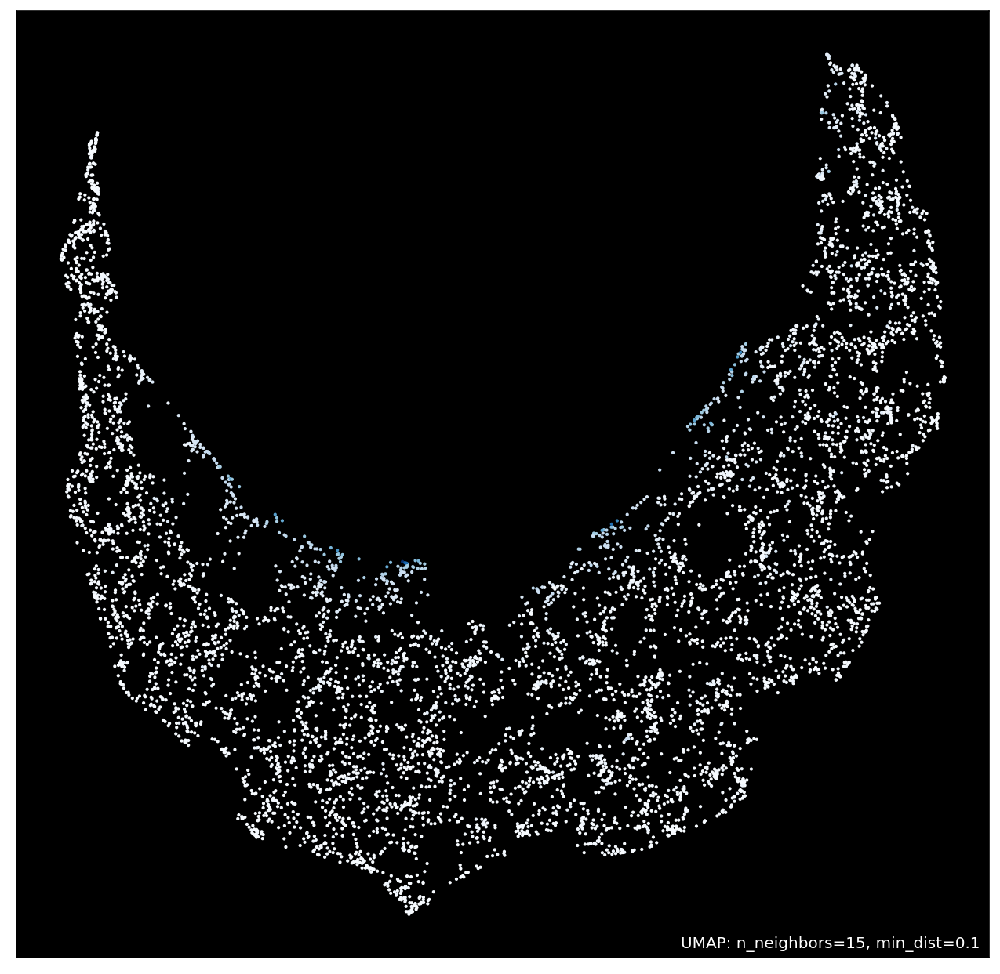

In [25]:
umap.plot.points(mapper_rel,  values=everything.f_3,  background='black') # color_key_cmap='Paired',


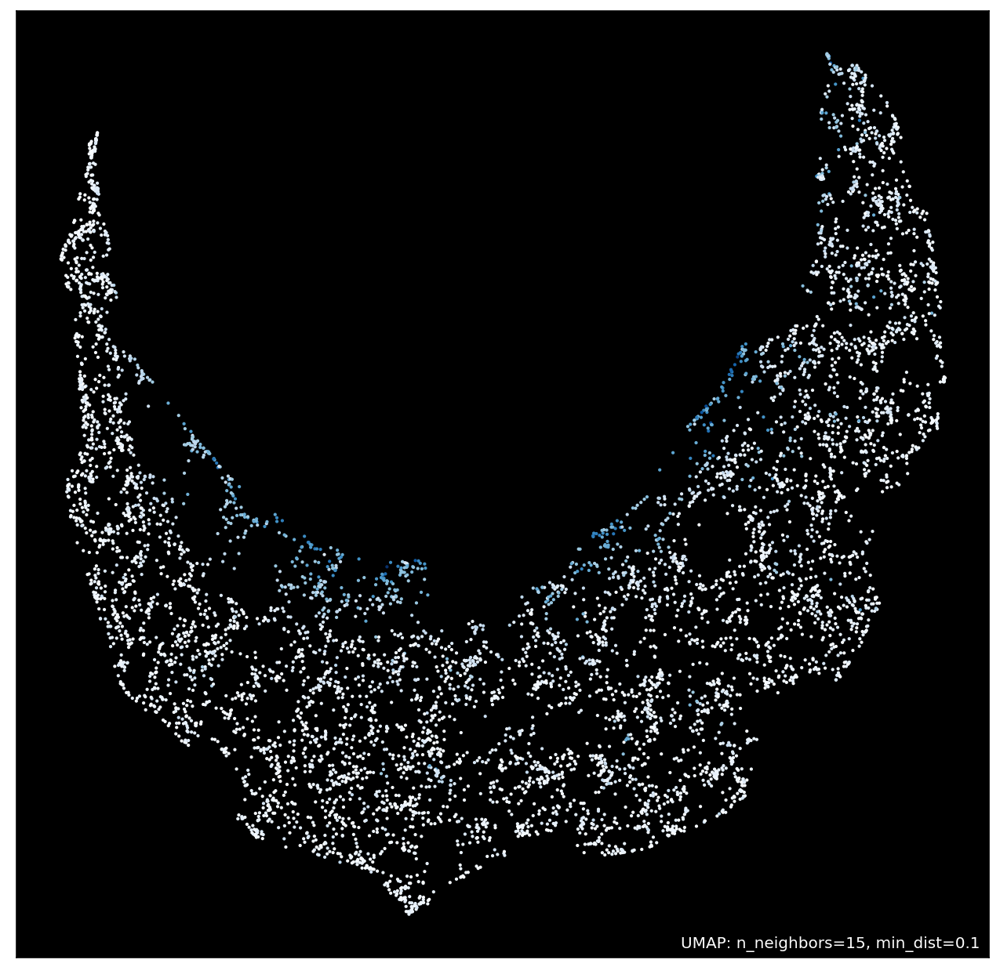

In [26]:
umap.plot.points(mapper_rel,  values=everything.f_UFO,  background='black') # color_key_cmap='Paired',


## Extremal analyses

 Let's look at the extremes of the UMAP and count labels.

In [27]:
fit = umap.UMAP()
%time u = fit.fit_transform(rel_data)

CPU times: user 4min 20s, sys: 5.19 s, total: 4min 26s
Wall time: 11.2 s


Same as before; I've re-drawn with grid to make it easier to define the extremes.

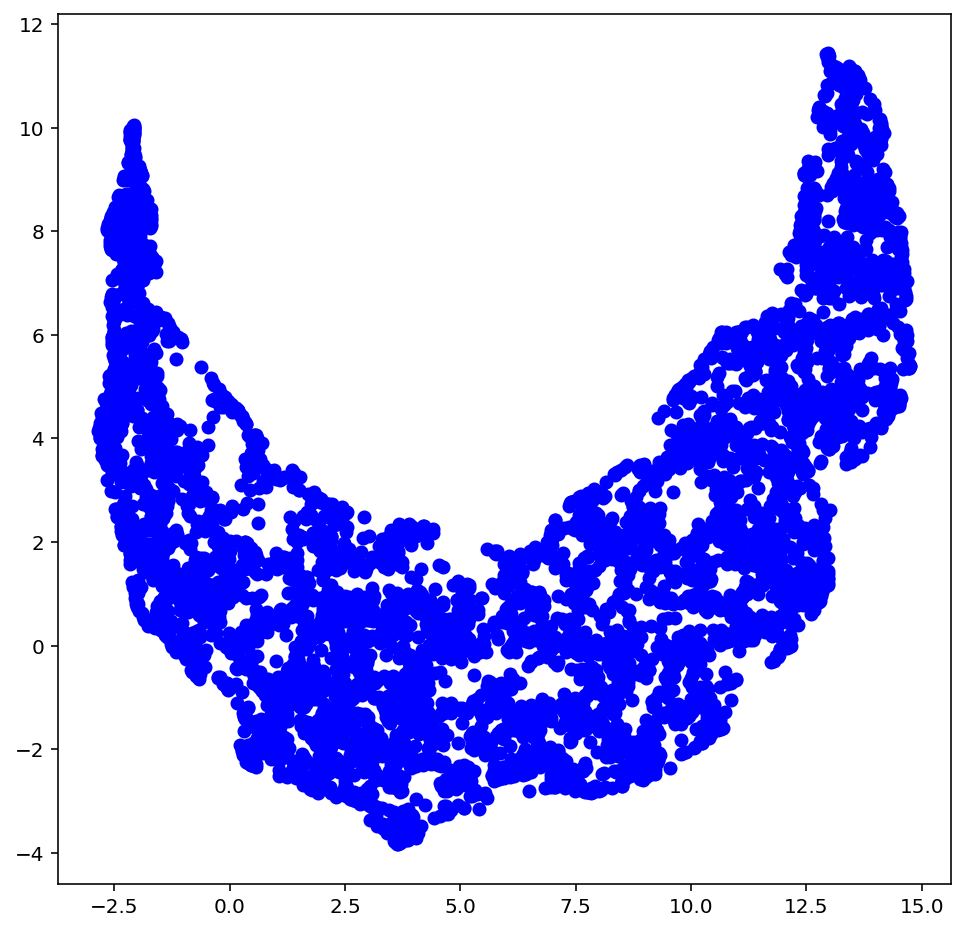

In [28]:
plt.scatter(u[:,0], u[:,1], c="blue")

Let's look at the top left. Defined as all images < 0 on x-axis and > 5 on the y-axis

In [29]:
rows1=np.where(u[:,0]<0)
rows2=np.where(u[:,1]>5)
good=np.intersect1d(rows1, rows2)
print(len(good))

518


###### There's about 603 images in this region from the space of ~6600.  So $9.xx\%$.

In [30]:
tmp=everything[[ "a_macrophage", "f_macrophage", "f_0", "f_1", "f_2", "f_3", "macro_manual_score"]]
macro_enriched=tmp.iloc[good]
print(macro_enriched)

      a_macrophage  f_macrophage       f_0       f_1       f_2       f_3  \
1              214      0.986175  0.013825  0.000000  0.000000  0.000000   
9              175      0.956284  0.021858  0.016393  0.005464  0.000000   
10             196      0.960784  0.014706  0.014706  0.004902  0.000000   
15             141      0.927632  0.019737  0.026316  0.013158  0.000000   
16             181      0.952632  0.015789  0.021053  0.000000  0.005263   
...            ...           ...       ...       ...       ...       ...   
6460           220      0.944206  0.042918  0.000000  0.008584  0.000000   
6559           241      0.930502  0.042471  0.007722  0.019305  0.000000   
6562           229      0.923387  0.028226  0.024194  0.024194  0.000000   
6573           249      0.950382  0.011450  0.011450  0.015267  0.000000   
6576           233      0.899614  0.027027  0.023166  0.042471  0.000000   

     macro_manual_score  
1                    GD  
9                     2  
10       

In [31]:
macro_enriched.macro_manual_score.value_counts()

GD     271
2       90
E       89
0       25
1       24
nan     19
Name: macro_manual_score, dtype: int64

In [32]:
everything.macro_manual_score.value_counts()


2      5664
GD      347
1       310
0       139
E       118
nan      30
Name: macro_manual_score, dtype: int64

In [33]:
macro_enriched.macro_manual_score.value_counts().GD / everything.macro_manual_score.value_counts().GD


0.7809798270893372

In [34]:
macro_enriched.macro_manual_score.value_counts().E / everything.macro_manual_score.value_counts().E


0.7542372881355932

In [35]:
macro_enriched.macro_manual_score.value_counts().nan / everything.macro_manual_score.value_counts().nan


0.6333333333333333

In [36]:
macro_enriched.macro_manual_score.value_counts()[0] / everything.macro_manual_score.value_counts()[0]


0.04784604519774011

In [37]:
macro_enriched.macro_manual_score.value_counts()[1] / everything.macro_manual_score.value_counts()[1]


0.25936599423631124

In [38]:
macro_enriched.macro_manual_score.value_counts()[2] / everything.macro_manual_score.value_counts()[2]


0.2870967741935484

In [39]:
macro_enriched.macro_manual_score.value_counts()[3] / everything.macro_manual_score.value_counts()[3]


0.17985611510791366

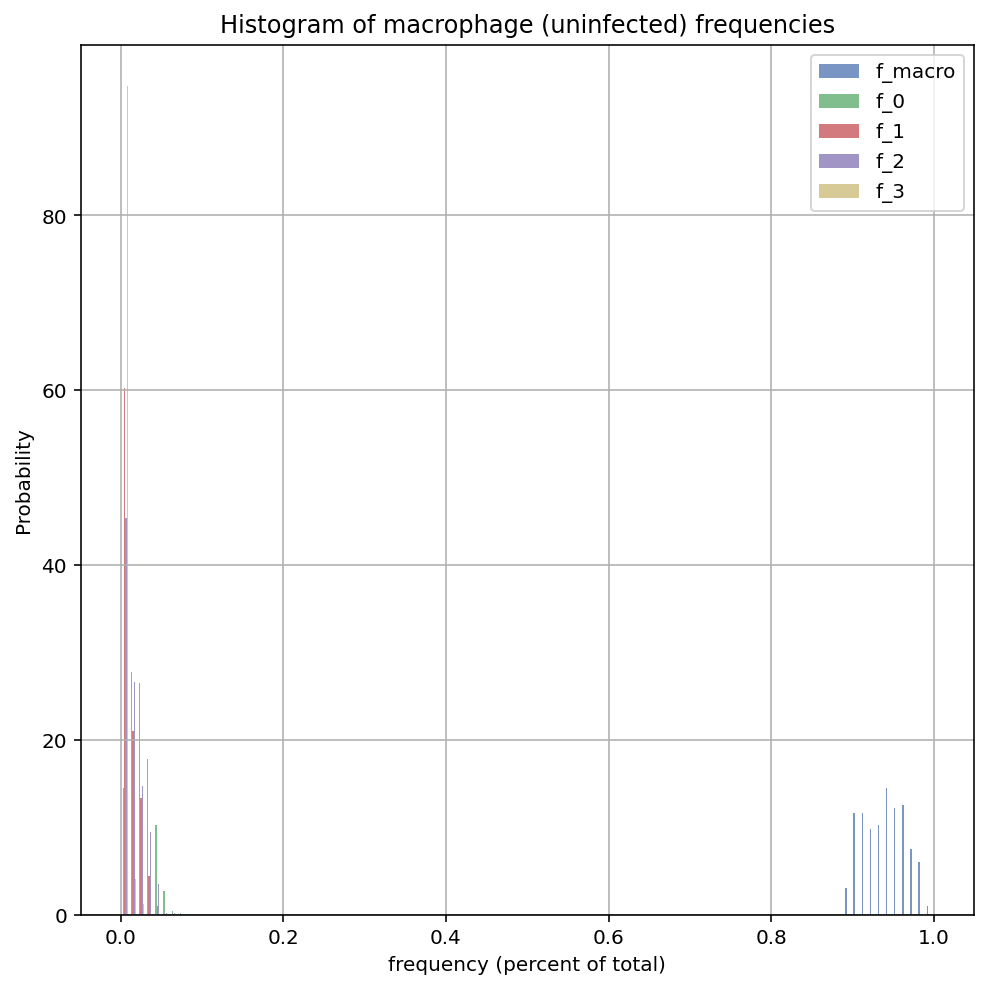

In [40]:
#n, bins, patches = plt.hist(macro_enriched.f_macrophage, 50, density=True, facecolor='g', alpha=0.75)
plt.style.use('seaborn-deep')

n, bins, patches = plt.hist([macro_enriched.f_macrophage, 
                             macro_enriched.f_0,
                             macro_enriched.f_1,
                             macro_enriched.f_2,
                             macro_enriched.f_3],  label=['f_macro', 'f_0', 'f_1', 'f_2', 'f_3'],
                            bins=100,
                           density=True,  alpha=0.75)

plt.xlabel('frequency (percent of total)')
plt.ylabel('Probability')
plt.title('Histogram of macrophage (uninfected) frequencies')
#plt.text(60, .025, r'$\mu=100,\ \sigma=15$')
#plt.xlim(40, 160)
#plt.ylim(0, 0.03)
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

In [41]:
tmp=everything[[ "name.x", "a_macrophage", "f_macrophage", "f_0", "f_1", "f_2", "f_3", "macro_manual_score"]]
macro_enriched=tmp.iloc[good]
print(macro_enriched)

           name.x  a_macrophage  f_macrophage       f_0       f_1       f_2  \
1           PGA63           214      0.986175  0.013825  0.000000  0.000000   
9            NOP5           175      0.956284  0.021858  0.016393  0.005464   
10          SRP54           196      0.960784  0.014706  0.014706  0.004902   
15          ARC15           141      0.927632  0.019737  0.026316  0.013158   
16    C2_01220W_A           181      0.952632  0.015789  0.021053  0.000000   
...           ...           ...           ...       ...       ...       ...   
6460         CDC5           220      0.944206  0.042918  0.000000  0.008584   
6559  C4_05340W_A           241      0.930502  0.042471  0.007722  0.019305   
6562         SCL1           229      0.923387  0.028226  0.024194  0.024194   
6573        SEC24           249      0.950382  0.011450  0.011450  0.015267   
6576        CDC28           233      0.899614  0.027027  0.023166  0.042471   

           f_3 macro_manual_score  
1     0.000000 

In [42]:
macro_enriched.rename(columns = {'name.x':'name'}, inplace = True)
tt=macro_enriched.name.value_counts()
print(tt[251:300])

CCT8           1
LIG1           1
CDC14          1
SPT7           1
SPC3           1
CR_08640C_A    1
C4_06800W_A    1
BMS1           1
PPR1           1
GND1           1
ARO2           1
C6_02260C_A    1
CR_02890C_A    1
SMC1           1
C2_08930W_A    1
ERG10          1
RPN2           1
GSC1           1
RPC31          1
RPS13          1
AUR1           1
C4_07060W_A    1
RPS28B         1
C4_04220W_A    1
GCD6           1
BET2           1
CDC23          1
RPL28          1
RPS21          1
DAD4           1
LCB2           1
C2_05680W_A    1
TUB1           1
ALG7           1
PMT1           1
C2_03930C_A    1
ERG1           1
CDC24          1
RNR21          1
Name: name, dtype: int64


/home/hallett/anaconda3/envs/deepmicroscopy/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


## Replicates


In [43]:
everything.columns


Index(['filename', 'n_objects', 'name.x', 'f_0', 'f_1', 'f_2', 'f_macrophage',
       'f_3', 'f_UFO', 'a_0', 'a_1', 'a_2', 'a_macrophage', 'a_3', 'a_UFO',
       'plate', 'row', 'column', 'replicate', 'name.y', 'macro_manual_score',
       'tc_manual_score', 'orf', 'common', 'feature_name', 'description',
       'sc_homologue', 'sc_ko_pheno', 'Merck Strain ID', 'GELC ID',
       'Primary CGD ID', 'YPD morphology', 'YPD + DOX morphology',
       'Serum morphology', 'Serum + DOX morphology', '100 μg/mL DOX growth',
       '5-FOA excision', 'No_DOX_score', 'DOX_Score', 'Essential_verdict',
       'Cidal_test', 'Macrophage + DOX morphology TO1',
       'Macrophage + DOX morphology TO2', 'Variance',
       'Screen pilot rep 1 OD600+DOX 19-03-21',
       'Screen pilot rep 1 MO+DOX 19-03-21',
       'Screen pilot rep 2 OD600+DOX 19-03-21',
       'Screen pilot rep 2 MO+DOX 19-03-21',
       'Screen pilot rep 1 OD600-DOX 19-03-21',
       'Screen pilot rep 1 MO-DOX 19-03-21',
       'Screen pi

In [44]:

reps=everything[["name.x", "replicate", "n_objects", "f_macrophage", "f_0", "f_1", "f_2", "f_3", "macro_manual_score", "filename"]]

reps[['macro_manual_score']] = reps[['macro_manual_score']].astype(str)

print(reps)

           name.x  replicate  n_objects  f_macrophage       f_0       f_1  \
0            ENP1          1        141      0.524823  0.070922  0.198582   
1           PGA63          1        217      0.986175  0.013825  0.000000   
2     C7_00780W_A          1        182      0.307692  0.032967  0.401099   
3     C3_06820C_A          1        153      0.503268  0.058824  0.267974   
4     C6_00640C_A          1        178      0.786517  0.050562  0.101124   
...           ...        ...        ...           ...       ...       ...   
6603  CR_05560W_A          2        262      0.702290  0.057252  0.099237   
6604        PRP22          2        296      0.662162  0.047297  0.138514   
6605         NIP7          2        289      0.664360  0.027682  0.155709   
6606         NOG2          2        262      0.656489  0.053435  0.129771   
6607  C7_01810W_A          2        242      0.566116  0.033058  0.181818   

           f_2       f_3 macro_manual_score                        filename

/home/hallett/anaconda3/envs/deepmicroscopy/lib/python3.7/site-packages/pandas/core/frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


Compare the number of objects detected in both replicates.

In [45]:
reps1=reps.loc[reps['replicate']==1]
reps2=reps.loc[reps['replicate']==2]
print(reps1)

           name.x  replicate  n_objects  f_macrophage       f_0       f_1  \
0            ENP1          1        141      0.524823  0.070922  0.198582   
1           PGA63          1        217      0.986175  0.013825  0.000000   
2     C7_00780W_A          1        182      0.307692  0.032967  0.401099   
3     C3_06820C_A          1        153      0.503268  0.058824  0.267974   
4     C6_00640C_A          1        178      0.786517  0.050562  0.101124   
...           ...        ...        ...           ...       ...       ...   
3350  CR_05560W_A          1        254      0.826772  0.051181  0.062992   
3351        PRP22          1        252      0.750000  0.059524  0.095238   
3352         NIP7          1        247      0.777328  0.048583  0.093117   
3353         NOG2          1        243      0.818930  0.032922  0.090535   
3354  C7_01810W_A          1        248      0.842742  0.032258  0.060484   

           f_2       f_3 macro_manual_score                        filename

In [46]:
reps_rearranged = pd.merge(reps1, reps2, on='name.x')
print(reps_rearranged)

           name.x  replicate_x  n_objects_x  f_macrophage_x     f_0_x  \
0            ENP1            1          141        0.524823  0.070922   
1           PGA63            1          217        0.986175  0.013825   
2     C7_00780W_A            1          182        0.307692  0.032967   
3     C3_06820C_A            1          153        0.503268  0.058824   
4     C6_00640C_A            1          178        0.786517  0.050562   
...           ...          ...          ...             ...       ...   
4515  CR_05560W_A            1          254        0.826772  0.051181   
4516        PRP22            1          252        0.750000  0.059524   
4517         NIP7            1          247        0.777328  0.048583   
4518         NOG2            1          243        0.818930  0.032922   
4519  C7_01810W_A            1          248        0.842742  0.032258   

         f_1_x     f_2_x     f_3_x macro_manual_score_x  \
0     0.198582  0.205674  0.000000                    2   
1    

In [47]:
reps_rearranged.macro_manual_score_x.value_counts()

2      3148
E       793
GD      188
nan     173
1       156
0        62
Name: macro_manual_score_x, dtype: int64

In [48]:
confusion = pd.DataFrame(np.zeros( (6,6), dtype=int ), columns=["0", "1", "2", "E", "GD", "nan"], index=["0", "1", "2", "E", "GD", "nan"])
print(confusion)

     0  1  2  E  GD  nan
0    0  0  0  0   0    0
1    0  0  0  0   0    0
2    0  0  0  0   0    0
E    0  0  0  0   0    0
GD   0  0  0  0   0    0
nan  0  0  0  0   0    0


In [49]:
for i in range(reps_rearranged.shape[0]):
    confusion.loc[reps_rearranged.iloc[i].macro_manual_score_x][reps_rearranged.iloc[i].macro_manual_score_y ]+=1

In [50]:
print(confusion)

      0    1     2    E   GD  nan
0    43   13     1    0    5    0
1    30  107    12    0    7    0
2     2   27  3029    0   27   63
E     0    0     0  793    0    0
GD    7   14    32    0  135    0
nan   0    0    72    0    0  101


In [51]:
diag=0
sm=0
for i in range(0,6):
    diag+=confusion.iloc[i][i]
    sm+=confusion.iloc[i].sum()
print(diag/sm)


0.9309734513274336


In [52]:
c2 = confusion.drop('2', axis=1)
c2 = c2.drop(index=('2'))
print(c2)
diag=0
sm=0
for i in range(0,5):
    diag+=c2.iloc[i][i]
    sm+=c2.iloc[i].sum()
print(diag/sm)

      0    1    E   GD  nan
0    43   13    0    5    0
1    30  107    0    7    0
E     0    0  793    0    0
GD    7   14    0  135    0
nan   0    0    0    0  101
0.9394422310756972


## Label classes according to frequencies

In [53]:
print(everything)

                            filename  n_objects       name.x       f_0  \
0      both_R1_P1_A1_1_00d00h00m.bmp        141         ENP1  0.070922   
1     both_R1_P1_A10_1_00d00h00m.bmp        217        PGA63  0.013825   
2     both_R1_P1_A11_1_00d00h00m.bmp        182  C7_00780W_A  0.032967   
3     both_R1_P1_A12_1_00d00h00m.bmp        153  C3_06820C_A  0.058824   
4      both_R1_P1_A2_1_00d00h00m.bmp        178  C6_00640C_A  0.050562   
...                              ...        ...          ...       ...   
6603   both_R2_P9_H5_1_00d00h35m.bmp        262  CR_05560W_A  0.057252   
6604   both_R2_P9_H6_1_00d00h35m.bmp        296        PRP22  0.047297   
6605   both_R2_P9_H7_1_00d00h35m.bmp        289         NIP7  0.027682   
6606   both_R2_P9_H8_1_00d00h35m.bmp        262         NOG2  0.053435   
6607   both_R2_P9_H9_1_00d00h35m.bmp        242  C7_01810W_A  0.033058   

           f_1       f_2  f_macrophage       f_3     f_UFO  a_0  ...  \
0     0.198582  0.205674      0.524823 

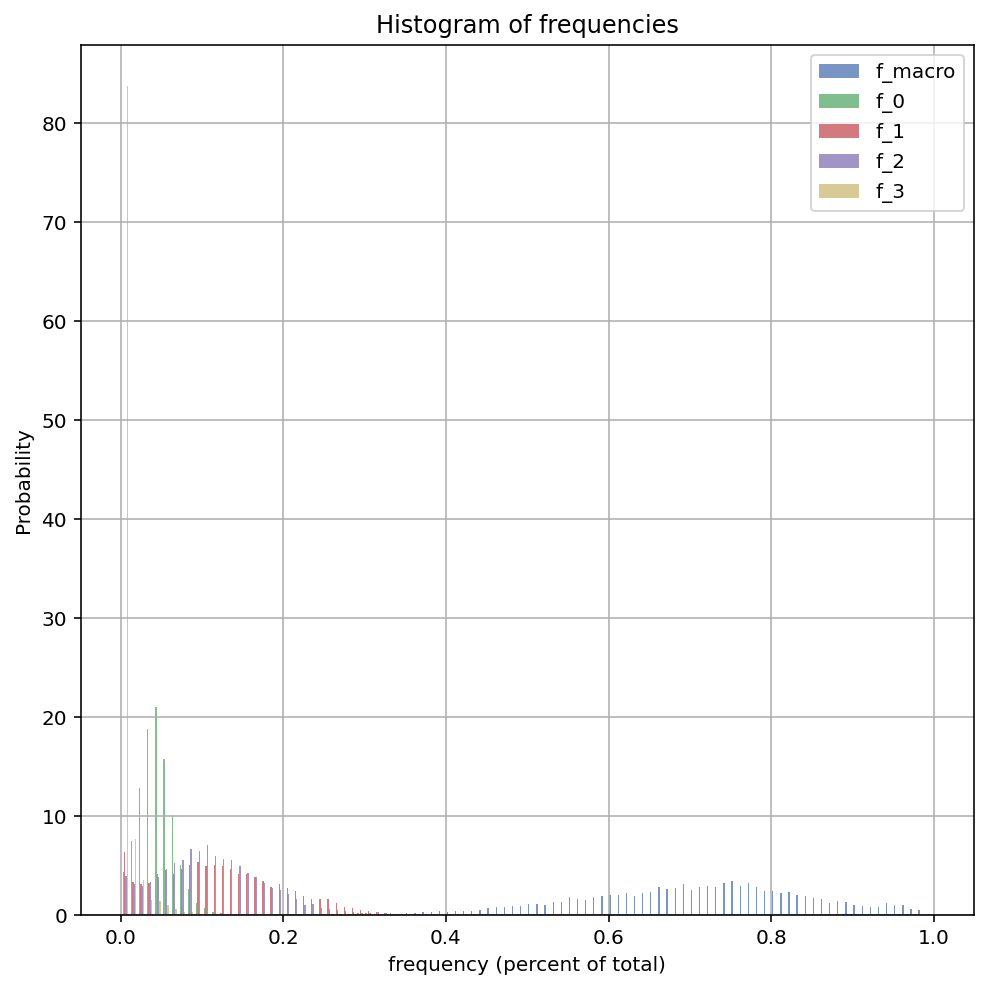

In [54]:
plt.style.use('seaborn-deep')

n, bins, patches = plt.hist([everything.f_macrophage, 
                             everything.f_0,
                             everything.f_1,
                             everything.f_2,
                             everything.f_3],  label=['f_macro', 'f_0', 'f_1', 'f_2', 'f_3'],
                            bins=100,
                           density=True,  alpha=0.75)

plt.xlabel('frequency (percent of total)')
plt.ylabel('Probability')
plt.title('Histogram of frequencies')
#plt.text(60, .025, r'$\mu=100,\ \sigma=15$')
#plt.xlim(40, 160)
#plt.ylim(0, 0.03)
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

Let's label each image as high if it's in the 95% percentil for a specific class (uninf, 0-3)

In [55]:
q_macrophage=everything.f_macrophage.quantile([.95]).iloc[0]
q_0=everything.f_0.quantile([.95]).iloc[0]
q_1=everything.f_1.quantile([.95]).iloc[0]
q_2=everything.f_2.quantile([.95]).iloc[0]
q_3=everything.f_3.quantile([.95]).iloc[0]
q_3

0.0308880308880308

In [56]:
q_macrophage

0.9300417877906973

In [57]:
everything['high_macrophage'] = pd.Series(np.where(everything.f_macrophage > q_macrophage,True,False), index=everything.f_macrophage.index)
everything['high_0'] = pd.Series(np.where(everything.f_0 > q_0,True,False), index=everything.f_0.index)
everything['high_1'] = pd.Series(np.where(everything.f_1 > q_1,True,False), index=everything.f_1.index)
everything['high_2'] = pd.Series(np.where(everything.f_2 > q_2,True,False), index=everything.f_2.index)
everything['high_3'] = pd.Series(np.where(everything.f_3 > q_3,True,False), index=everything.f_3.index)

everything['high_m_gd'] = pd.Series(np.where(everything.macro_manual_score=="GD",True,False), index=everything.macro_manual_score.index)
everything['high_m_e'] = pd.Series(np.where(everything.macro_manual_score=="E",True,False), index=everything.macro_manual_score.index)
everything['high_m_0'] = pd.Series(np.where(everything.macro_manual_score=="0",True,False), index=everything.macro_manual_score.index)
everything['high_m_1'] = pd.Series(np.where(everything.macro_manual_score=="1",True,False), index=everything.macro_manual_score.index)
everything['high_m_2'] = pd.Series(np.where(everything.macro_manual_score=="2",True,False), index=everything.macro_manual_score.index)
everything['high_m_nan'] = pd.Series(np.where(everything.macro_manual_score=="nan",True,False), index=everything.macro_manual_score.index)


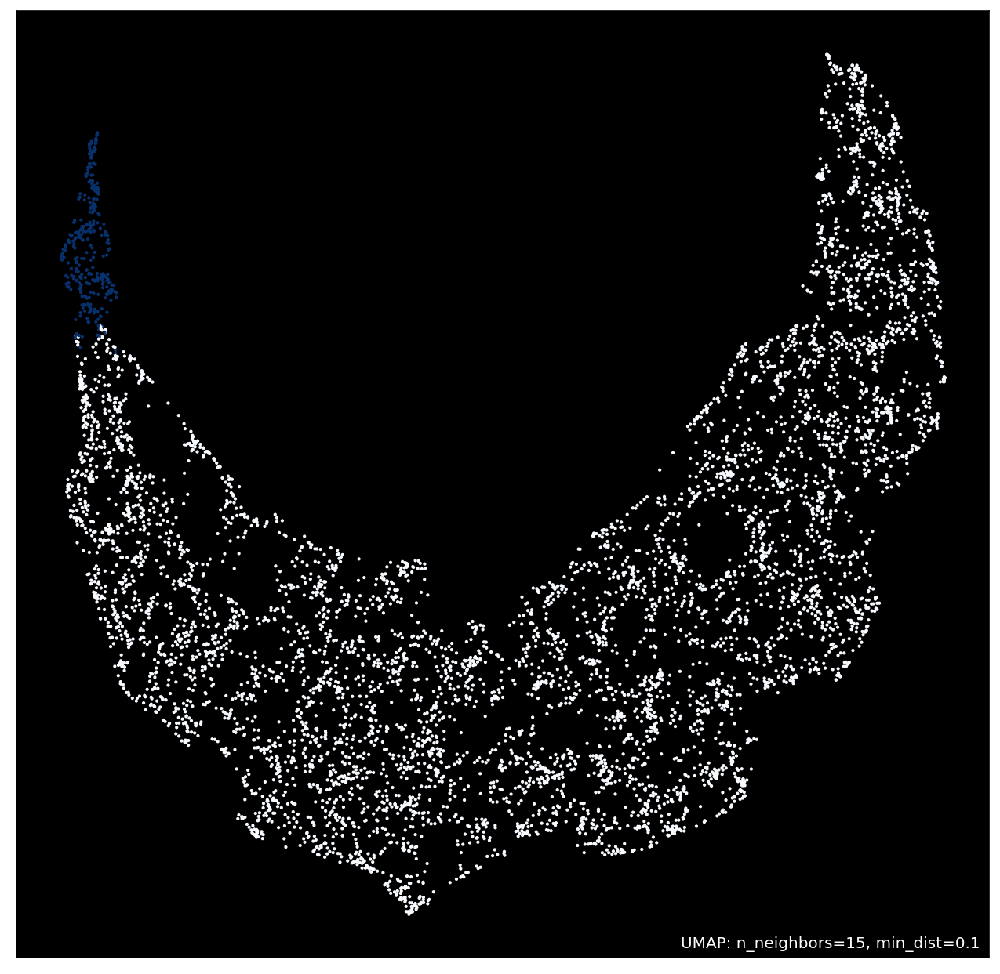

In [58]:
umap.plot.points(mapper_rel,  values=everything.high_macrophage,  background='black') # color_key_cmap='Paired',


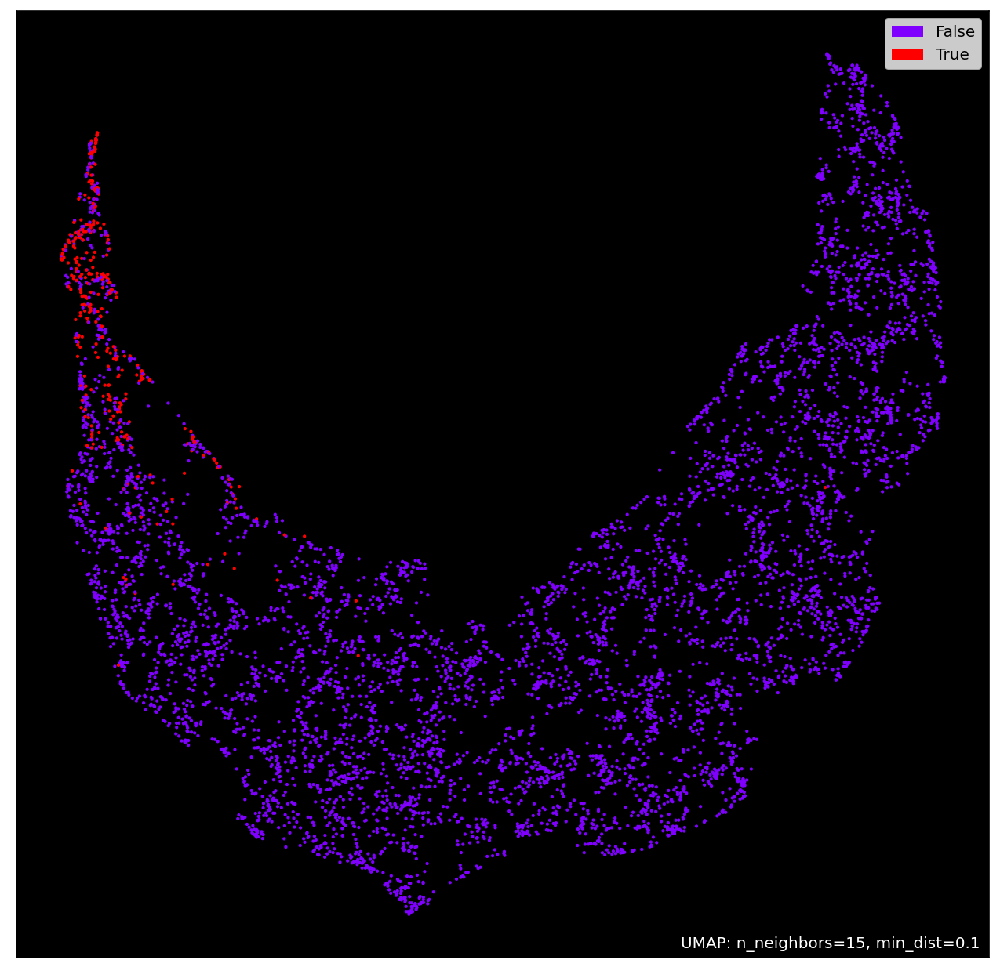

In [59]:
umap.plot.points(mapper_rel,  labels=everything.high_m_gd, theme='fire') # color_key_cmap='Paired',


<AxesSubplot:>

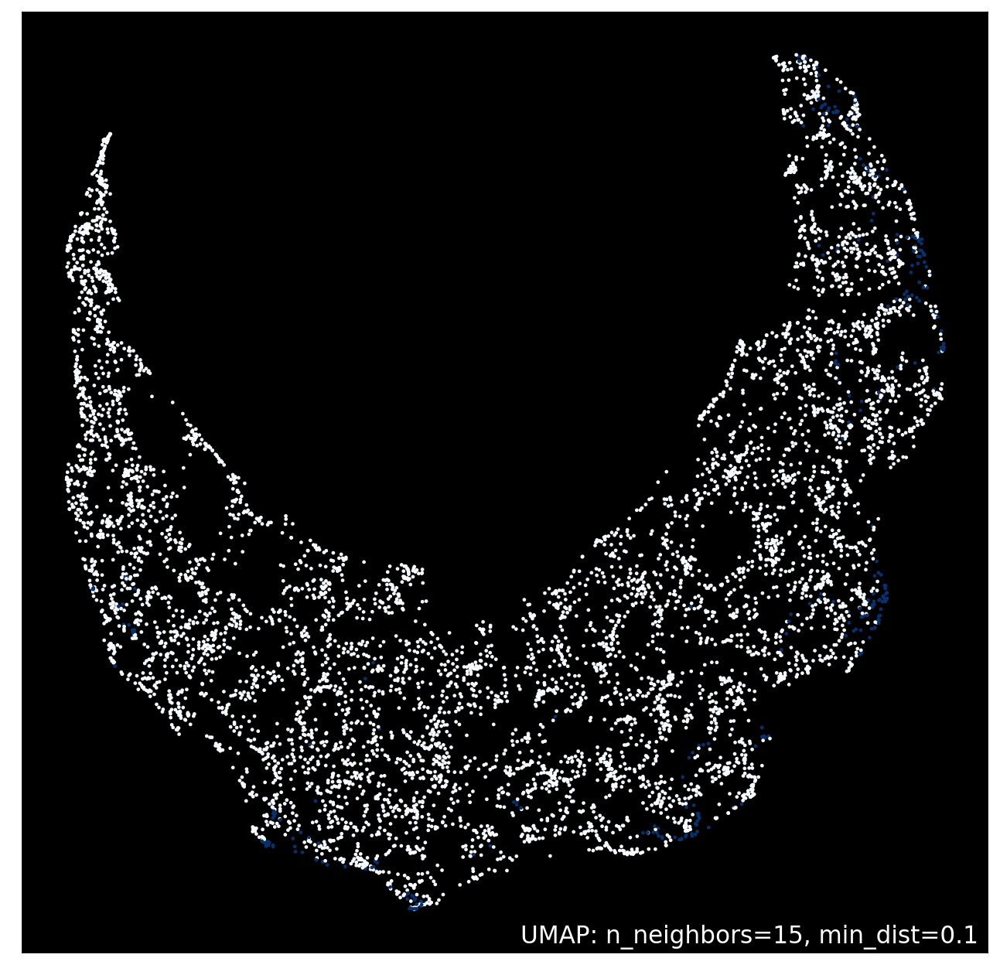

In [265]:
umap.plot.points(mapper_rel,  values=everything.high_0,  background='black') # color_key_cmap='Paired',


<AxesSubplot:>

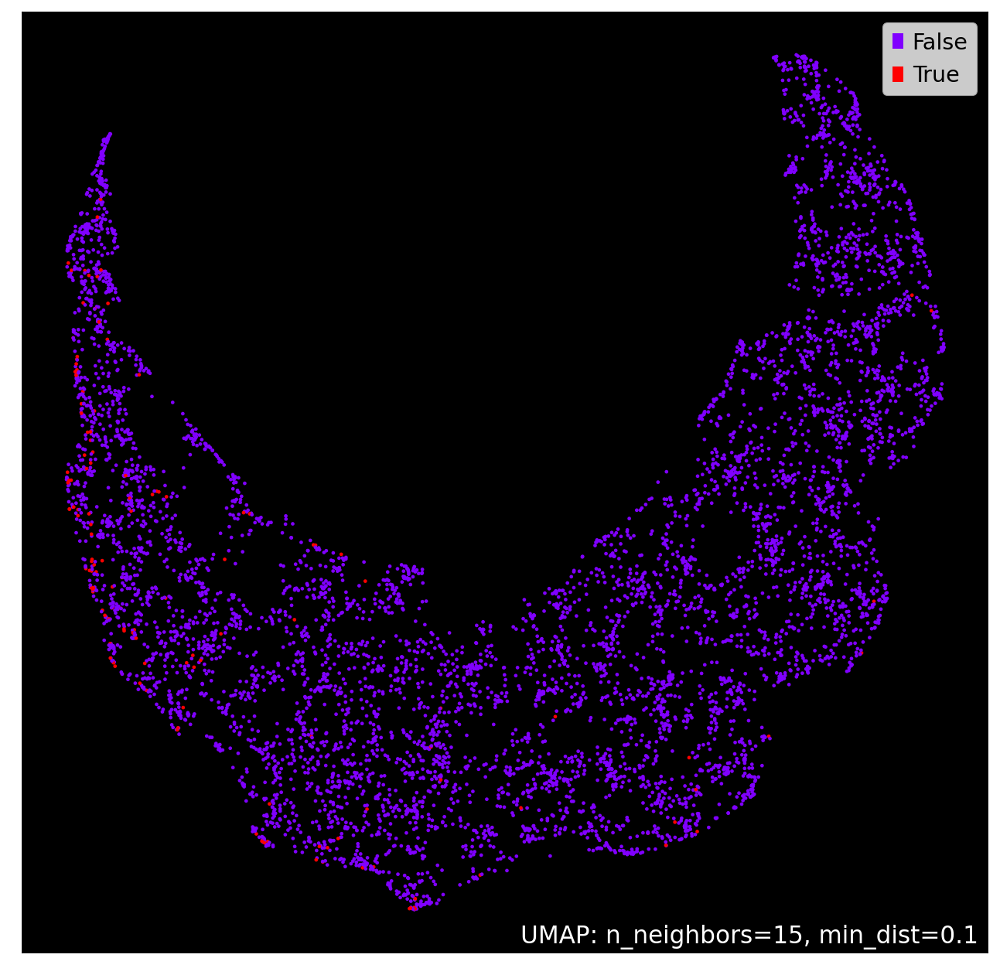

In [276]:
umap.plot.points(mapper_rel,  labels=everything.high_m_0, theme='fire') # color_key_cmap='Paired',


<AxesSubplot:>

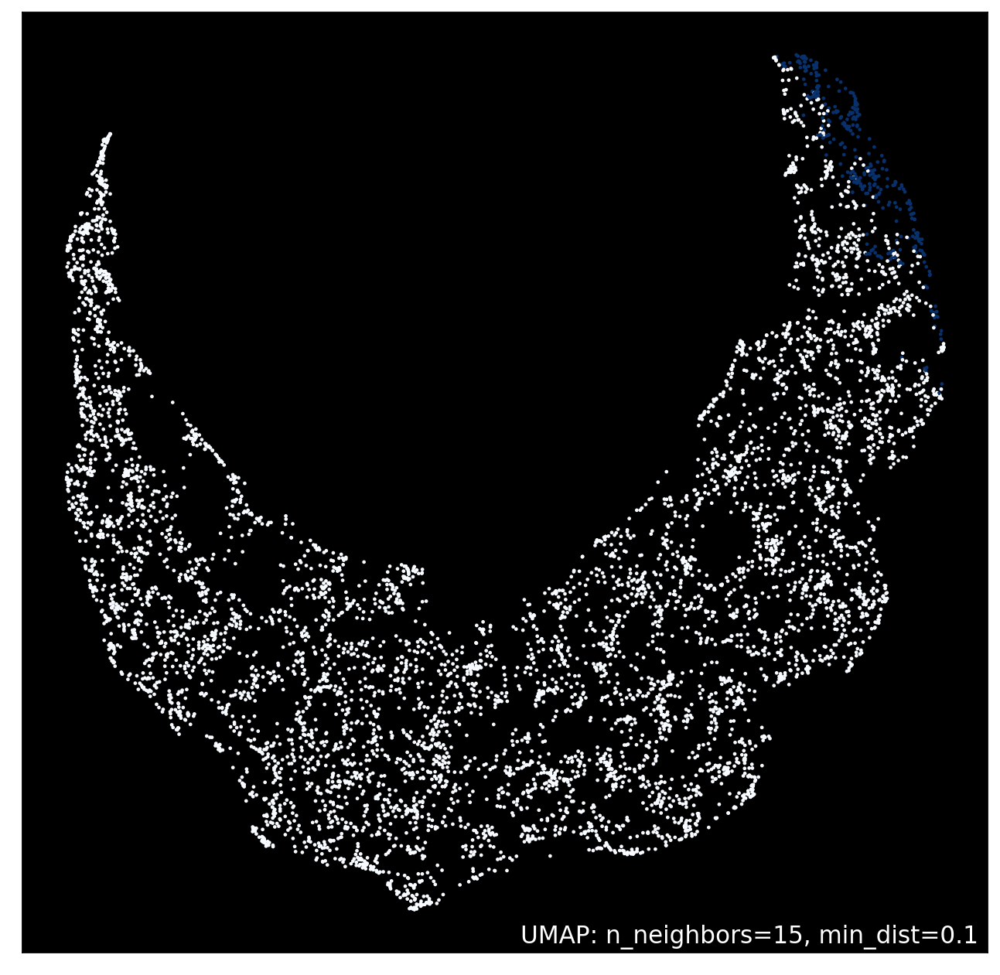

In [266]:
umap.plot.points(mapper_rel,  values=everything.high_1,  background='black') # color_key_cmap='Paired',


<AxesSubplot:>

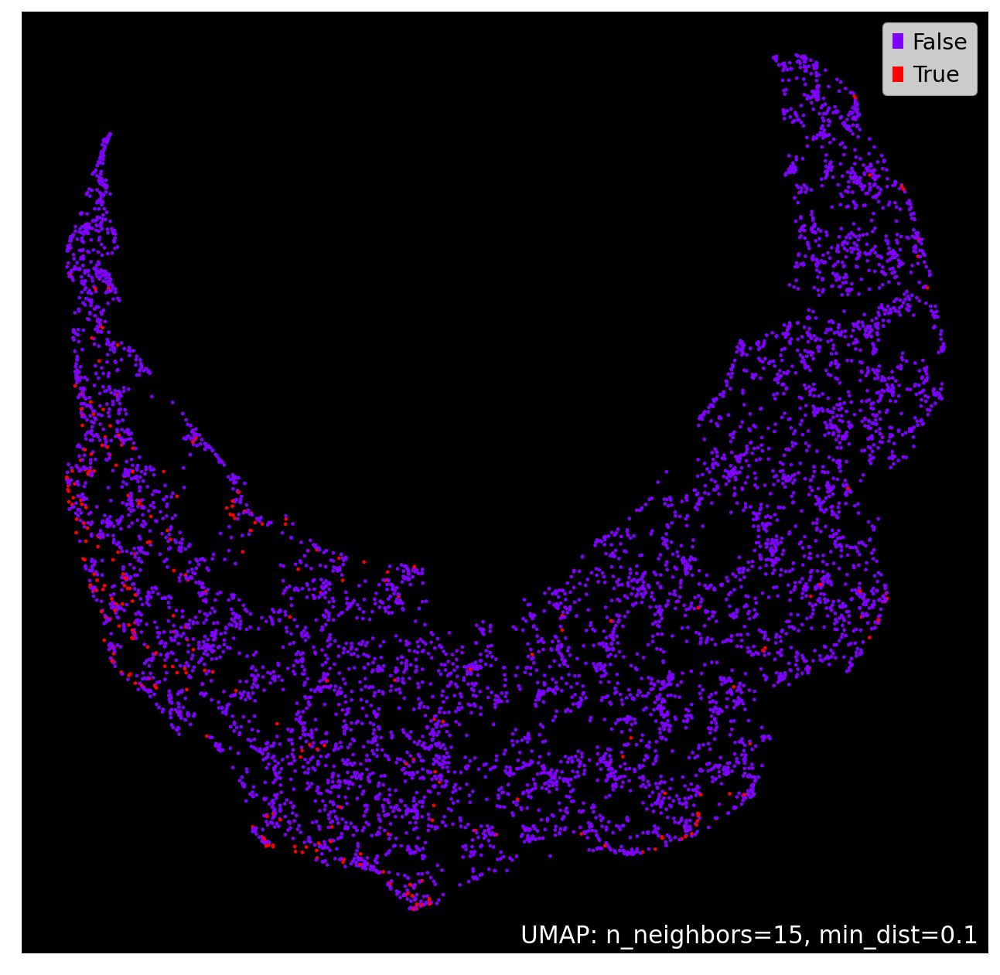

In [277]:
umap.plot.points(mapper_rel,  labels=everything.high_m_1, theme='fire') # color_key_cmap='Paired',


<AxesSubplot:>

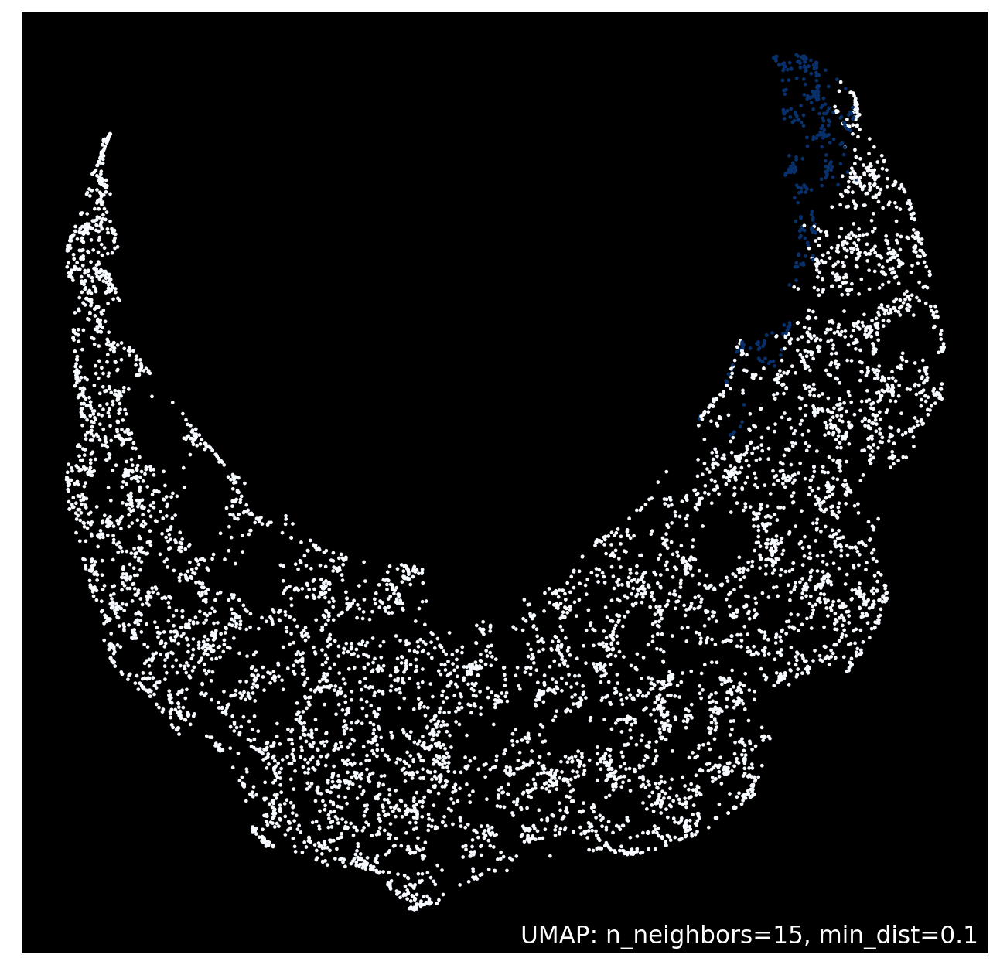

In [267]:
umap.plot.points(mapper_rel,  values=everything.high_2,  background='black') # color_key_cmap='Paired',


<AxesSubplot:>

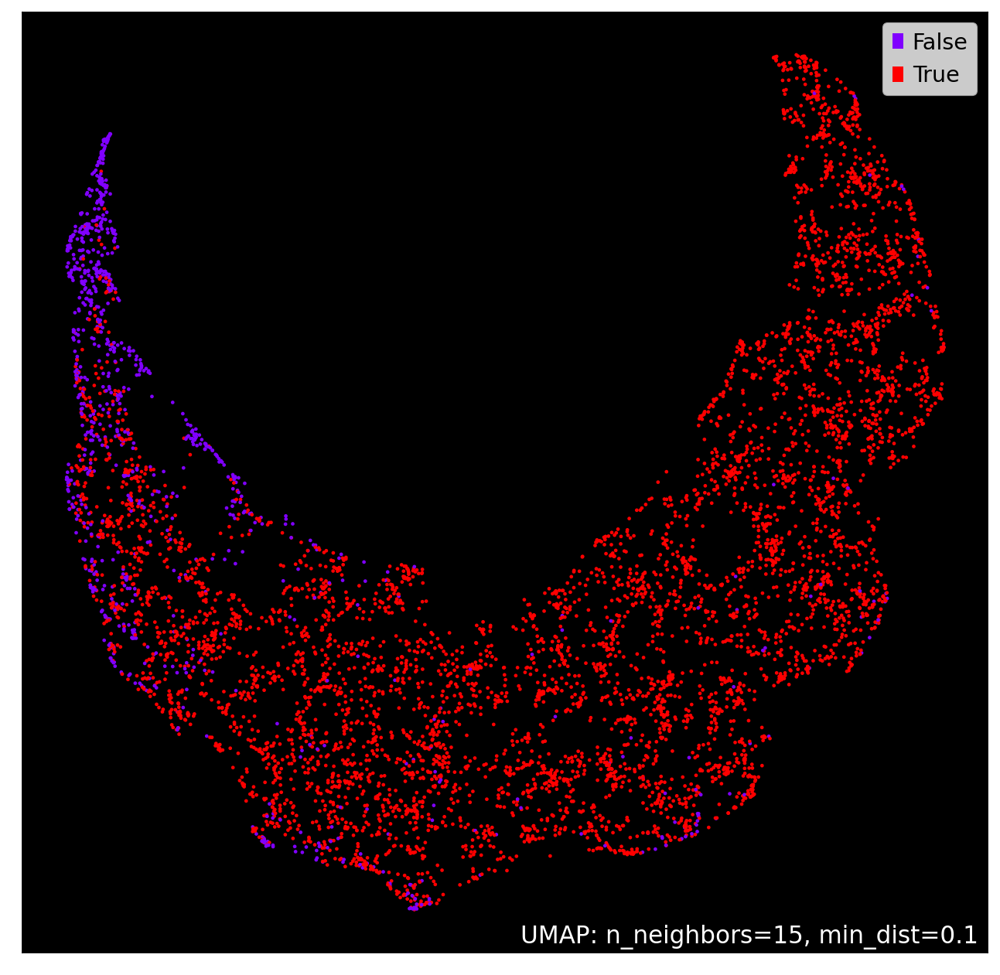

In [278]:
umap.plot.points(mapper_rel,  labels=everything.high_m_2, theme='fire') # color_key_cmap='Paired',


<AxesSubplot:>

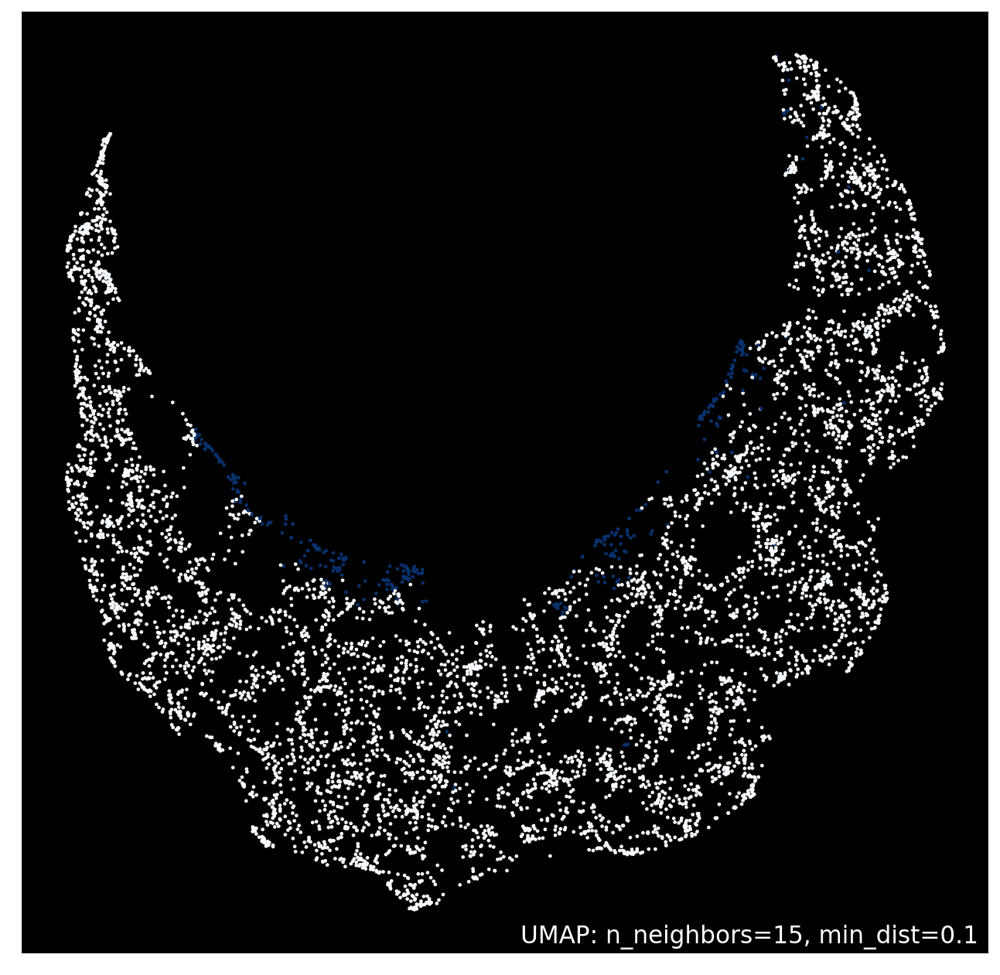

In [268]:
umap.plot.points(mapper_rel,  values=everything.high_3,  background='black') # color_key_cmap='Paired',


<AxesSubplot:>

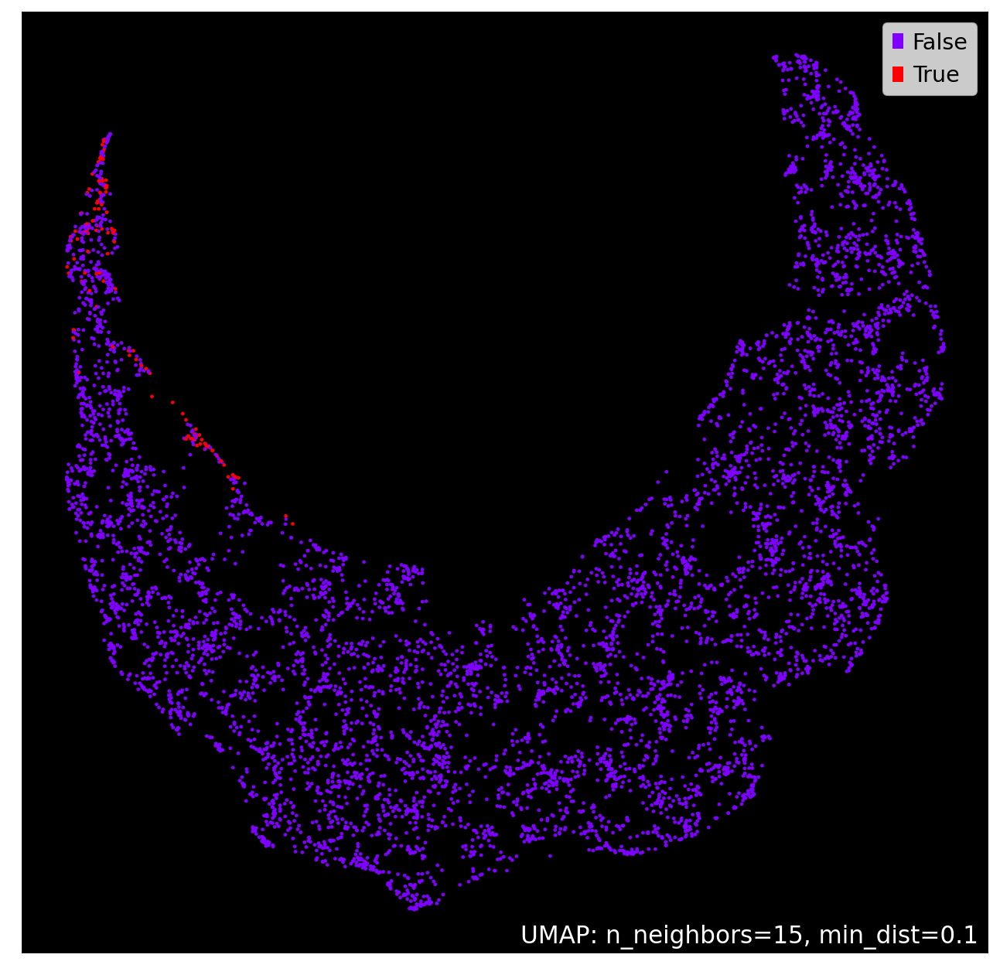

In [281]:
umap.plot.points(mapper_rel,  labels=everything.high_m_e, theme='fire') # color_key_cmap='Paired',


<AxesSubplot:>

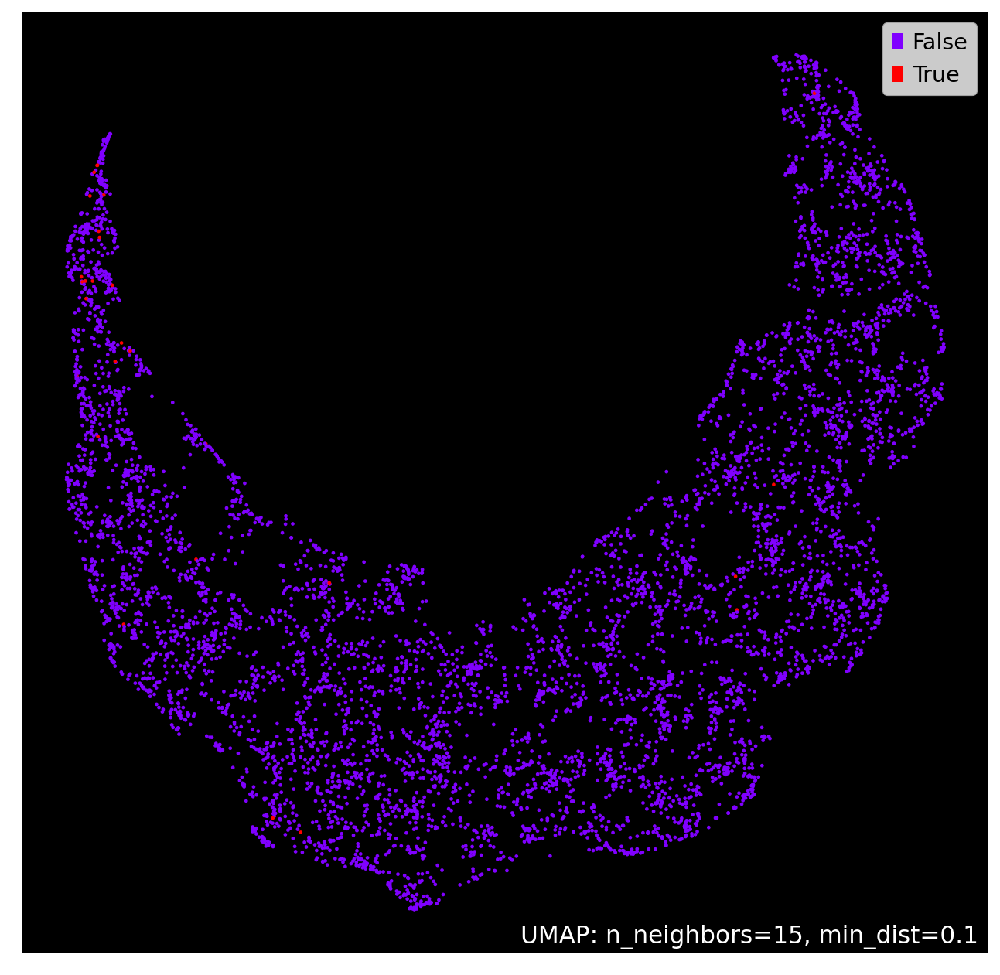

In [282]:
umap.plot.points(mapper_rel,  labels=everything.high_m_nan, theme='fire') # color_key_cmap='Paired',


In [305]:
print(everything)

                            filename  n_objects       name.x       f_0  \
0      both_R1_P1_A1_1_00d00h00m.bmp        141         ENP1  0.070922   
1     both_R1_P1_A10_1_00d00h00m.bmp        217        PGA63  0.013825   
2     both_R1_P1_A11_1_00d00h00m.bmp        182  C7_00780W_A  0.032967   
3     both_R1_P1_A12_1_00d00h00m.bmp        153  C3_06820C_A  0.058824   
4      both_R1_P1_A2_1_00d00h00m.bmp        178  C6_00640C_A  0.050562   
...                              ...        ...          ...       ...   
6603   both_R2_P9_H5_1_00d00h35m.bmp        262  CR_05560W_A  0.057252   
6604   both_R2_P9_H6_1_00d00h35m.bmp        296        PRP22  0.047297   
6605   both_R2_P9_H7_1_00d00h35m.bmp        289         NIP7  0.027682   
6606   both_R2_P9_H8_1_00d00h35m.bmp        262         NOG2  0.053435   
6607   both_R2_P9_H9_1_00d00h35m.bmp        242  C7_01810W_A  0.033058   

           f_1       f_2  f_macrophage       f_3     f_UFO  a_0  ...  high_0  \
0     0.198582  0.205674      0

In [306]:
explore_rare_95=everything[[ "filename", "name.x", "high_macrophage", "high_0", "high_1", "high_2", "high_3"]]
print(explore_rare_95)
explore_rare_95['num_special']=explore_rare_95.sum(axis=1)
explore_rare_95['num_special'].value_counts()

                            filename       name.x  high_macrophage  high_0  \
0      both_R1_P1_A1_1_00d00h00m.bmp         ENP1            False   False   
1     both_R1_P1_A10_1_00d00h00m.bmp        PGA63             True   False   
2     both_R1_P1_A11_1_00d00h00m.bmp  C7_00780W_A            False   False   
3     both_R1_P1_A12_1_00d00h00m.bmp  C3_06820C_A            False   False   
4      both_R1_P1_A2_1_00d00h00m.bmp  C6_00640C_A            False   False   
...                              ...          ...              ...     ...   
6603   both_R2_P9_H5_1_00d00h35m.bmp  CR_05560W_A            False   False   
6604   both_R2_P9_H6_1_00d00h35m.bmp        PRP22            False   False   
6605   both_R2_P9_H7_1_00d00h35m.bmp         NIP7            False   False   
6606   both_R2_P9_H8_1_00d00h35m.bmp         NOG2            False   False   
6607   both_R2_P9_H9_1_00d00h35m.bmp  C7_01810W_A            False   False   

      high_1  high_2  high_3  
0      False   False   False  
1

/tmp/ipykernel_124870/3713783292.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  explore_rare_95['num_special']=explore_rare_95.sum(axis=1)
/tmp/ipykernel_124870/3713783292.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  explore_rare_95['num_special']=explore_rare_95.sum(axis=1)


0    5173
1    1236
2     180
3      19
Name: num_special, dtype: int64

<AxesSubplot:>

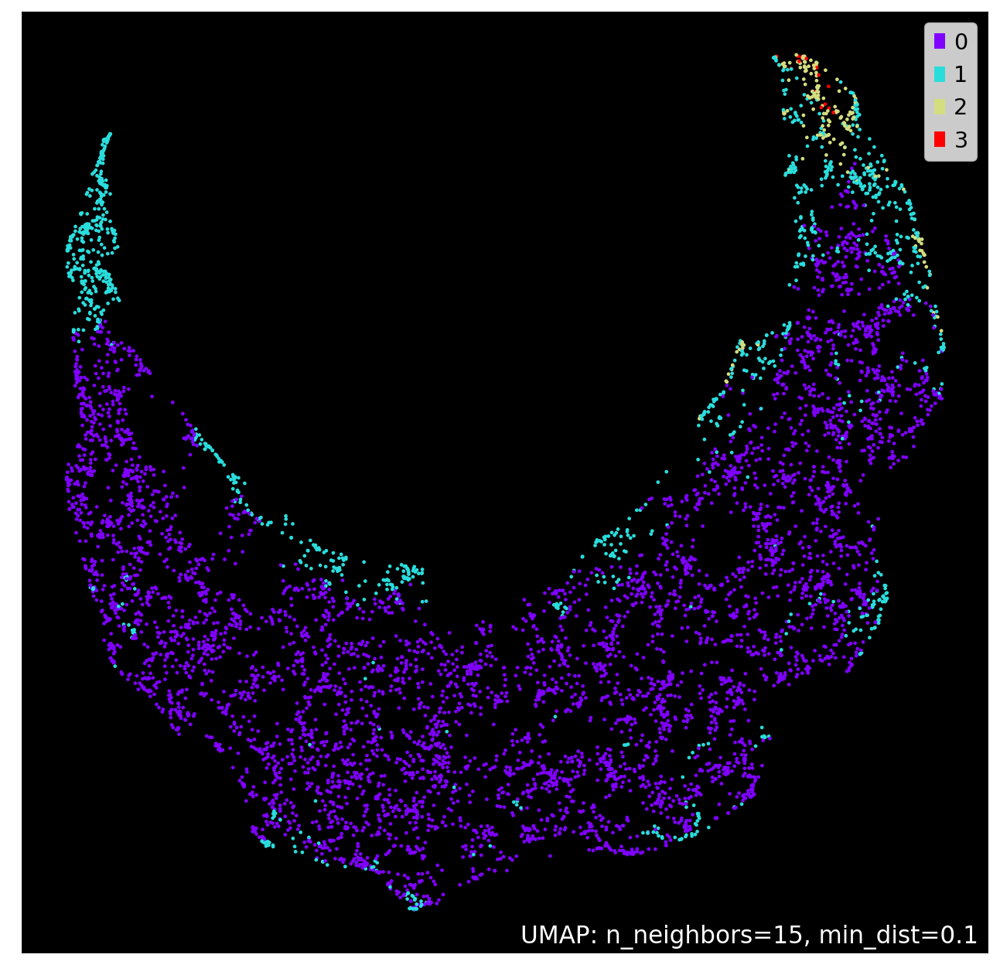

In [307]:
umap.plot.points(mapper_rel,  labels=explore_rare_95.num_special, theme='fire') # color_key_cmap='Paired',


In [317]:
triplets = explore_rare_95[explore_rare_95.num_special==3]
print(triplets.drop(columns=["filename"]))

           name.x  high_macrophage  high_0  high_1  high_2  high_3  \
2984         ARO3            False    True    True    True   False   
2987         GRX3            False    True   False    True    True   
2990         AGE1            False   False    True    True    True   
3001  C2_04180C_A            False    True   False    True    True   
3002         MRF1            False    True    True    True   False   
3003  C1_12440W_A            False    True    True    True   False   
3023  C2_09500W_A            False    True    True    True   False   
3026  C5_04950C_A            False    True    True    True   False   
3037        VID27            False    True    True    True   False   
3049         LIP4            False    True    True    True   False   
3058  C5_05090W_A            False    True    True    True   False   
3074         HNT1            False    True    True    True   False   
3098         LIP3            False    True    True    True   False   
3113  C3_02390W_A   

In [323]:
doublets = explore_rare_95[explore_rare_95.num_special==2]
print(doublets.drop(columns=["filename"])[151:180])

             name.x  high_macrophage  high_0  high_1  high_2  high_3  \
4684          ECM38            False   False   False    True    True   
4685    C1_12860C_A            False   False    True    True   False   
4693    C4_02190C_A            False   False    True    True   False   
4780         TAF145            False    True    True   False   False   
4934    CR_09590W_A            False    True    True   False   False   
5072  control_CaSS1            False   False    True    True   False   
5417           IMP1            False   False    True    True   False   
5454           TEA1            False   False    True    True   False   
5753           DPL1            False   False    True    True   False   
5774           TGS1            False   False   False    True    True   
5798           MAP2            False   False    True    True   False   
5812           LEU2            False   False   False    True    True   
5897           GET1            False   False    True    True   F

In [332]:
singletons_0 = explore_rare_95[explore_rare_95.num_special==1] # and explore_rare_95.high_0==True]
singletons_0 = singletons_0[singletons_0.high_0==True]
singletons_0 = singletons_0.drop(columns=["filename"])
print(singletons_0[0:50])

           name.x  high_macrophage  high_0  high_1  high_2  high_3  \
12          CDC37            False    True   False   False   False   
20           ERG3            False    True   False   False   False   
32           AGM1            False    True   False   False   False   
34    C1_14240W_A            False    True   False   False   False   
40    C4_05210W_A            False    True   False   False   False   
41    CR_02770C_A            False    True   False   False   False   
43           VAS1            False    True   False   False   False   
44    C4_05820W_A            False    True   False   False   False   
50           TFA1            False    True   False   False   False   
63           NOG1            False    True   False   False   False   
69           RRS1            False    True   False   False   False   
81           ERG4            False    True   False   False   False   
87           KRE9            False    True   False   False   False   
119         UTP22   

<AxesSubplot:>

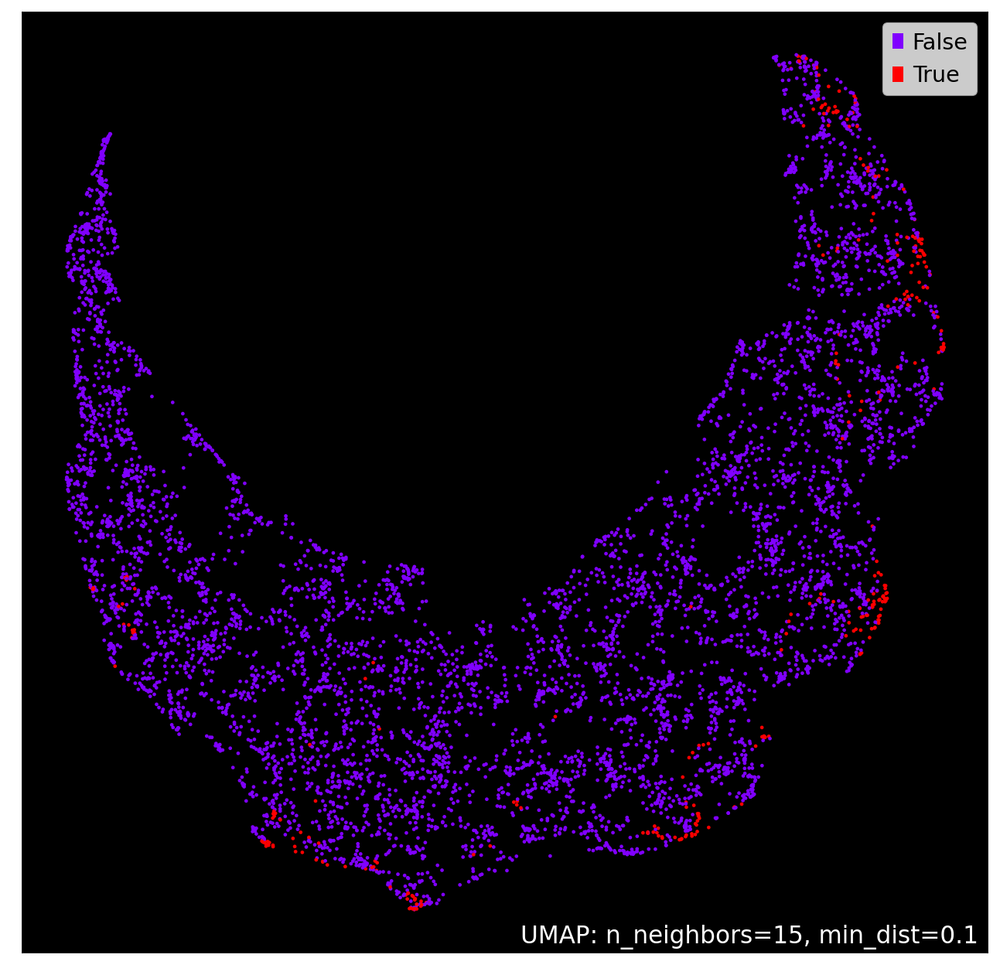

In [329]:
umap.plot.points(mapper_rel,  labels=explore_rare_95.high_0, theme='fire') # color_key_cmap='Paired',


<AxesSubplot:>

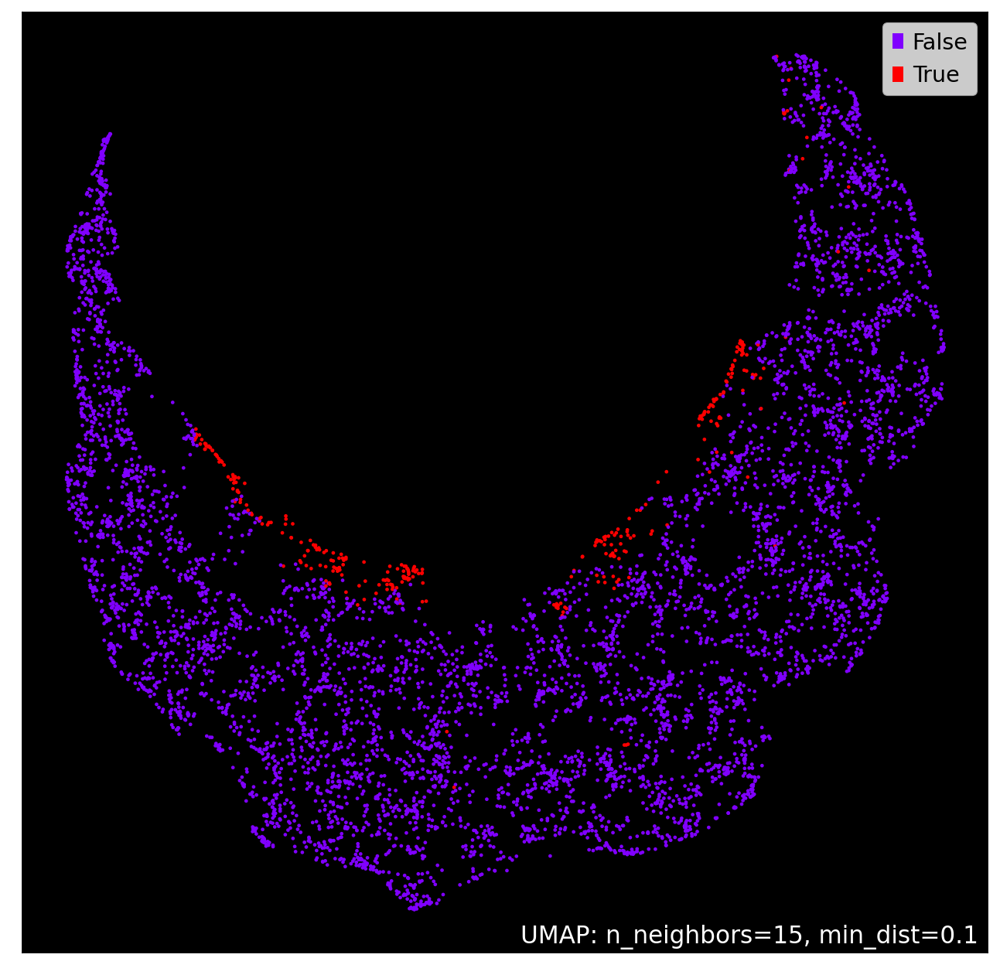

In [333]:
umap.plot.points(mapper_rel,  labels=explore_rare_95.high_3, theme='fire') # color_key_cmap='Paired',


In [339]:
singletons_3 = explore_rare_95[explore_rare_95.num_special==1] # and explore_rare_95.high_0==True]
singletons_3 = singletons_3[singletons_3.high_3==True]
singletons_3 = singletons_3.drop(columns=["filename"])
singletons_3.rename(columns = {'name.x':'name'}, inplace = True)

print(singletons_3[1:50])

            name  high_macrophage  high_0  high_1  high_2  high_3  num_special
95   C1_07360W_A            False   False   False   False    True            1
100        RPO26            False   False   False   False    True            1
116         YPD1            False   False   False   False    True            1
120        FMP45            False   False   False   False    True            1
149  C5_05350W_A            False   False   False   False    True            1
180  C5_00150C_A            False   False   False   False    True            1
188        UTP18            False   False   False   False    True            1
196         NOP4            False   False   False   False    True            1
200         DAD1            False   False   False   False    True            1
201  C5_01430C_A            False   False   False   False    True            1
202  C5_04840C_A            False   False   False   False    True            1
210         RPF2            False   False   False   

In [349]:
everything.rename(columns = {'name.x':'name'}, inplace = True)
print(everything[everything.name=="RPO26"].description[:1])

100    Putative RNA polymerase subunit; heterozygous ...
Name: description, dtype: object


## Discussion

What we do see here is that the definition of 0, 1, 2, GD is very different between the manual and computational approach. The computational approach, assuming reasonable accuracy by Candescnece, objectively partitions images by their relative frequency (or absolute counts). The relative and absolute UMAPs are pretty similar in structure.
It seems that there may be some bias towards sparse images in the manual approach. Candescence captures that but largely does not distinguish the cells in the those regions between 0, 1, 2, and 3. There are other images with more severe changes in their relative frequency vectors for these clases.
It would be interesting to revisit these images and compare against some of the computational calls on 0, 1, and 2. 
The manual GD class is objectively not complete; that is there are many more images with similar non-infected rates (or, if you would prefer, "with similar total cells").
The computational classes of 1 and 2 (upper right hand side on the east and west shores respectively) are distinct but located close to each other in the UMAP. The class 0 is ubiquitous across the continental part of the UMAP. The UFOs show up in the same place, which might be interesting. The 3's tend to be scatter, which is unexpected.

A lot more manual effort is needed to sample images from these subspaces to see if we can get an intuitive characterization of their properties, and to make sure Candescence is performing appropriately.

## Miscellaneous

storage of old code

In [ ]:
import pandas as pd
import numpy as np
import umap
import umap.plot

mapper = umap.UMAP().fit(df_data)
umap.plot.points(mapper)


In [ ]:
import hdbscan
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

In [ ]:
kmeans_labels = cluster.KMeans(n_clusters=10).fit_predict(df_data)

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(
    embedding_abs[:, 0],
    embedding_abs[:, 1]
   # c=[sns.color_palette()[x] for x in df.species_short.map({"Adelie":0, "Chinstrap":1, "Gentoo":2})])
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the Grace dataset (absolute)', fontsize=24)

In [ ]:
left=tmp.iloc[np.where(u[:,0]<5)]
left.macro_manual_score.value_counts()

In [ ]:
right=tmp.iloc[np.where(u[:,0]>=5)]
right.macro_manual_score.value_counts()